### Problem Statement

- In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

- For many incumbent operators, retaining high profitable customers is the number one business goal.

- To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

- In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

#### Understanding and defining churn

- There are two main models of payment in the telecom industry - postpaid (customers pay a monthly/annual bill after using the services) and prepaid (customers pay/recharge with a certain amount in advance and then use the services).

- In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and you directly know that this is an instance of churn.

- In the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

- Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully.  Also, prepaid is the most common model in India and Southeast Asia, while postpaid is more common in Europe in North America.

- This project is based on the Indian and Southeast Asian market.

#### Definitions of churn

There are various ways to define churn, such as:

- Revenue-based churn: Customers who have not utilised any revenue-generating facilities such as mobile internet, outgoing calls, SMS etc. over a given period of time. One could also use aggregate metrics such as ‘customers who have generated less than INR 4 per month in total/average/median revenue’.
The main shortcoming of this definition is that there are customers who only receive calls/SMSes from their wage-earning counterparts, i.e. they don’t generate revenue but use the services. For example, many users in rural areas only receive calls from their wage-earning siblings in urban areas.

- Usage-based churn: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.
A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

- In this project, you will use the usage-based definition to define churn.

#### High-value churn

- In the Indian and the Southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.
In this project, you will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

#### Understanding the business objective and the data

- The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 
The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

#### Understanding customer behaviour during churn

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

- The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

- The ‘action’ phase: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

- The ‘churn’ phase: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.

In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

#### Import the libraries

In [3]:
#import numpy and pandas for numerical calculations and data analysis respectively
import numpy as np
import pandas as pd

#import data visualisation libraries
import matplotlib.pyplot as plt
import seaborn as sns

#import the logistic regression
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

#supress the warnings
import warnings
warnings.filterwarnings('ignore')

# To display the max rows and columns
pd.set_option('display.max_columns',230)
pd.set_option('display.max_rows',1000)

In [4]:
#import the dataset
tc = pd.read_csv('telecom_churn_data.csv')
tc.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [5]:
#Check the shape of the dataset
tc.shape

(99999, 226)

In [6]:
#Check the datatypes and missing values in the dataset
tc.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

In [7]:
tc.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [8]:
#Check the missing values in the dataset
tc.isnull().sum()

mobile_number                   0
circle_id                       0
loc_og_t2o_mou               1018
std_og_t2o_mou               1018
loc_ic_t2o_mou               1018
last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
arpu_6                          0
arpu_7                          0
arpu_8                          0
arpu_9                          0
onnet_mou_6                  3937
onnet_mou_7                  3859
onnet_mou_8                  5378
onnet_mou_9                  7745
offnet_mou_6                 3937
offnet_mou_7                 3859
offnet_mou_8                 5378
offnet_mou_9                 7745
roam_ic_mou_6                3937
roam_ic_mou_7                3859
roam_ic_mou_8                5378
roam_ic_mou_9                7745
roam_og_mou_6                3937
roam_og_mou_7                3859
roam_og_mou_8                5378
roam_og_mou_9                7745
loc_og_t2t_mou

In [9]:
# Check the percentage of missing values in the dataset
round(100*((tc.isnull().sum())/tc.shape[0]).sort_values(ascending=False),2)

arpu_3g_6                   74.85
night_pck_user_6            74.85
total_rech_data_6           74.85
arpu_2g_6                   74.85
max_rech_data_6             74.85
fb_user_6                   74.85
av_rech_amt_data_6          74.85
date_of_last_rech_data_6    74.85
count_rech_2g_6             74.85
count_rech_3g_6             74.85
date_of_last_rech_data_7    74.43
total_rech_data_7           74.43
fb_user_7                   74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
count_rech_2g_7             74.43
av_rech_amt_data_7          74.43
arpu_2g_7                   74.43
count_rech_3g_7             74.43
arpu_3g_7                   74.43
total_rech_data_9           74.08
count_rech_3g_9             74.08
fb_user_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
date_of_last_rech_data_9    74.08
night_pck_user_9            74.08
arpu_2g_9                   74.08
count_rech_2g_9             74.08
av_rech_amt_da

- Lot of values is having more than 70% missing values, we need to check the unique values first.

In [10]:
# Let us check the unique values
tc.nunique().sort_values()

std_ic_t2o_mou_6                1
std_og_t2c_mou_8                1
std_og_t2c_mou_9                1
std_ic_t2o_mou_9                1
std_ic_t2o_mou_8                1
std_og_t2c_mou_7                1
std_ic_t2o_mou_7                1
last_date_of_month_9            1
std_og_t2c_mou_6                1
last_date_of_month_7            1
circle_id                       1
loc_og_t2o_mou                  1
std_og_t2o_mou                  1
loc_ic_t2o_mou                  1
last_date_of_month_8            1
last_date_of_month_6            1
night_pck_user_7                2
night_pck_user_8                2
night_pck_user_9                2
night_pck_user_6                2
fb_user_9                       2
fb_user_8                       2
fb_user_7                       2
fb_user_6                       2
monthly_2g_9                    5
monthly_2g_6                    5
monthly_2g_7                    6
monthly_2g_8                    6
monthly_3g_9                   11
monthly_3g_6  

In [11]:
#Dropping the columns which are having unique values
tc = tc.drop(['std_ic_t2o_mou_6','std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_9','std_ic_t2o_mou_8','std_og_t2c_mou_7','std_ic_t2o_mou_7','last_date_of_month_9','std_og_t2c_mou_6','last_date_of_month_7','circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_8','last_date_of_month_6'], axis=1)

In [12]:
tc.shape

(99999, 210)

In [13]:
# Let us check the unique values once again
tc.nunique().sort_values()

fb_user_9                       2
fb_user_8                       2
fb_user_7                       2
fb_user_6                       2
night_pck_user_9                2
night_pck_user_8                2
night_pck_user_6                2
night_pck_user_7                2
monthly_2g_6                    5
monthly_2g_9                    5
monthly_2g_7                    6
monthly_2g_8                    6
monthly_3g_9                   11
monthly_3g_8                   12
monthly_3g_6                   12
monthly_3g_7                   15
sachet_3g_6                    25
count_rech_3g_6                25
count_rech_3g_9                27
sachet_3g_7                    27
sachet_3g_9                    27
count_rech_3g_7                28
sachet_3g_8                    29
count_rech_3g_8                29
date_of_last_rech_data_9       30
date_of_last_rech_data_6       30
date_of_last_rech_9            30
date_of_last_rech_6            30
date_of_last_rech_data_8       31
count_rech_2g_

In [14]:
#Drop the mobile number column as it is unique id
tc = tc.drop('mobile_number', axis=1)

In [15]:
tc.shape

(99999, 209)

In [16]:
#check the categorical columns
tc.select_dtypes(include='object')

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,NaN
1,6/29/2014,7/31/2014,8/28/2014,9/30/2014,NaN,7/25/2014,8/10/2014,NaN
2,6/17/2014,7/24/2014,8/14/2014,9/29/2014,NaN,NaN,NaN,9/17/2014
3,6/28/2014,7/31/2014,8/31/2014,9/30/2014,NaN,NaN,NaN,NaN
4,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
99994,6/3/2014,7/20/2014,8/26/2014,9/25/2014,NaN,NaN,NaN,NaN
99995,6/17/2014,7/17/2014,8/24/2014,9/26/2014,NaN,NaN,NaN,NaN
99996,6/13/2014,7/26/2014,NaN,9/2/2014,6/13/2014,NaN,NaN,NaN
99997,6/17/2014,7/19/2014,8/20/2014,9/17/2014,6/17/2014,7/19/2014,8/20/2014,9/17/2014


In [17]:
# retriving the columns which has any null values
tc_null_cols = tc.columns[tc.isnull().any()]
round((100*tc[tc_null_cols].isnull().sum()/len(tc)).sort_values(ascending=False),2)

count_rech_3g_6             74.85
fb_user_6                   74.85
arpu_2g_6                   74.85
av_rech_amt_data_6          74.85
night_pck_user_6            74.85
count_rech_2g_6             74.85
max_rech_data_6             74.85
arpu_3g_6                   74.85
total_rech_data_6           74.85
date_of_last_rech_data_6    74.85
total_rech_data_7           74.43
count_rech_3g_7             74.43
av_rech_amt_data_7          74.43
arpu_2g_7                   74.43
date_of_last_rech_data_7    74.43
night_pck_user_7            74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
arpu_3g_7                   74.43
max_rech_data_7             74.43
date_of_last_rech_data_9    74.08
total_rech_data_9           74.08
count_rech_3g_9             74.08
max_rech_data_9             74.08
av_rech_amt_data_9          74.08
count_rech_2g_9             74.08
fb_user_9                   74.08
night_pck_user_9            74.08
arpu_3g_9                   74.08
arpu_2g_9     

- Currently we are not dropping the rows which are having more than 50% missing values in order to derive the new features. Once we derive the new features, we will drop the unwanted columns

In [18]:
## Removing variables which do not capture any variance
tc = tc.drop(['date_of_last_rech_9','date_of_last_rech_8','date_of_last_rech_7','date_of_last_rech_6'], axis=1)

In [19]:
tc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,

In [20]:
tc.shape

(99999, 205)

In [21]:
#Impute onnet, offnet, roam_og, loc_og, std_og, isd_og, spl_og, og_others as 0 as total_og_mou is 0 for customer
og_data_cols = ['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2f_mou_9', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_og_mou_9', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'isd_og_mou_9', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'spl_og_mou_9', 'og_others_6', 'og_others_7', 'og_others_8', 'og_others_9']
tc[og_data_cols] = tc[og_data_cols].fillna(0)
tc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,0.00,NaN,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53

In [22]:
#Impute roam_ic, loc_ic, std_ic, spl_ic, isd_ic, ic_others as 0 as total_ic_mou is 0 for customer
ic_data_cols = ['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'loc_ic_mou_9', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_t2f_mou_9', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'std_ic_mou_9', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'spl_ic_mou_9', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'isd_ic_mou_9', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'ic_others_9', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8']
tc[ic_data_cols] = tc[ic_data_cols].fillna(0)
tc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,34.047,355.074,268.321,86.285,24.11,78.6

In [23]:
#Fill null value as 0 for data pack recharge amount
#['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7','av_rech_amt_data_8', 'av_rech_amt_data_9']
data_rech_cols = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9']
tc[data_rech_cols] = tc[data_rech_cols].fillna(0)
tc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,34.047,355.074,268.321,86.285,24.11,78.6

In [24]:
#Dervie new feature
tc['total_data_rech_amt_6'] = tc['total_rech_data_6'] * tc['av_rech_amt_data_6']
tc['total_data_rech_amt_7'] = tc['total_rech_data_7'] * tc['av_rech_amt_data_7']
tc['total_data_rech_amt_8'] = tc['total_rech_data_8'] * tc['av_rech_amt_data_8']
tc['total_data_rech_amt_9'] = tc['total_rech_data_9'] * tc['av_rech_amt_data_9']
tc.head(10)

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,

In [25]:
#Dervie new feature to get the total amount spent on recharge and data each month
tc['total_rech_6'] = tc['total_data_rech_amt_6'] + tc['total_rech_amt_6']
tc['total_rech_7'] = tc['total_data_rech_amt_7'] + tc['total_rech_amt_7']
tc['total_rech_8'] = tc['total_data_rech_amt_8'] + tc['total_rech_amt_8']
tc['total_rech_9'] = tc['total_data_rech_amt_9'] + tc['total_rech_amt_9']
tc.head(10)

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.1

In [26]:
## Total recharge amount for June + July as 6th and 7th months are considered as good phase
tc['total_rech_6_7'] = tc['total_rech_6'] + tc['total_rech_7']
round(tc['total_rech_6_7'].mean(), 2)

970.66

In [27]:
#Now dropping the columns which are having more than 50% missing values
tc = tc.loc[:,100*((tc.isnull().sum())/len(tc))<50]
tc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9,total_rech_6_7
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58,252.0,252.0,252.0,0.0,614.0,504.0,504.0,0.0,1118.0
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.1

In [28]:
tc.shape

(99999, 194)

In [29]:
#Calculating the average of first two months (i.e.,June and July)
good_phase_avg = (tc['total_rech_6_7'])/2

#Finding the cutoff which is the 70% of the good phase average recharge amount
cut_off = np.percentile(good_phase_avg,70)

#Filtering the users whose good phase average amount >= to the cutoff of 70th percentile
hvc = tc[good_phase_avg>=cut_off]

print("Number of High Value Customers in the dataset: %d\n"%len(hvc))

Number of High Value Customers in the dataset: 30001



In [30]:
#Check the missing value percentage once again
round((100*tc.isnull().sum()/len(tc)).sort_values(ascending=False),2)

arpu_6                   0.0
count_rech_2g_7          0.0
total_rech_num_9         0.0
total_rech_amt_6         0.0
total_rech_amt_7         0.0
total_rech_amt_8         0.0
total_rech_amt_9         0.0
max_rech_amt_6           0.0
max_rech_amt_7           0.0
max_rech_amt_8           0.0
max_rech_amt_9           0.0
last_day_rch_amt_6       0.0
last_day_rch_amt_7       0.0
last_day_rch_amt_8       0.0
last_day_rch_amt_9       0.0
total_rech_data_6        0.0
total_rech_data_7        0.0
total_rech_data_8        0.0
total_rech_data_9        0.0
max_rech_data_6          0.0
max_rech_data_7          0.0
max_rech_data_8          0.0
max_rech_data_9          0.0
total_rech_num_8         0.0
total_rech_num_7         0.0
total_rech_num_6         0.0
spl_ic_mou_6             0.0
std_ic_t2f_mou_9         0.0
std_ic_mou_6             0.0
std_ic_mou_7             0.0
std_ic_mou_8             0.0
std_ic_mou_9             0.0
total_ic_mou_6           0.0
total_ic_mou_7           0.0
total_ic_mou_8

In [31]:
#We need to tag the churned customers (churn=1 , else 0) based on the 9th month as follows:
#Those who have not made any calls (either incoming or outgoing) and have not used the mobild network even once in the churn phase. The attributes we need to tag churners are
#total_ic_mou_9
#total_og_mou_9
#vol_2g_mb_9
#vol_3g_mb_9

def getChurn(data,Churn_Phase_Month=9):
    churn_features=['vol_2g_mb_','vol_3g_mb_','total_og_mou_','total_ic_mou_']
    flag = ~data[[s + str(Churn_Phase_Month) for s in churn_features]].any(axis=1)
    flag = flag.map({True:1,False:0})
    return flag

We have 2441 users tagged as churners out of 30001 high value customers
High value churn percentage: 8.14%


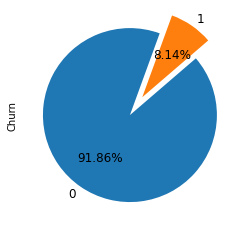

0    27560
1     2441
Name: Churn, dtype: int64

In [32]:
#Check the churn and not churn data for high value customers
hvc['Churn'] = getChurn(hvc,9)
print("We have {} users tagged as churners out of {} high value customers".format(len(hvc[hvc.Churn == 1]),hvc.shape[0]))
print("High value churn percentage: {}%".format(round(100*(len(hvc[hvc.Churn == 1])/hvc.shape[0]),2)))

hvc["Churn"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', fontsize=12, startangle=70)
plt.show()

hvc.Churn.value_counts()

- Out of 30001 High Value Customers, 2441 users were tagged as churners.
- High value churn percentage is 8.14%

In [33]:
#check the shape of the high value customers
hvc.shape

(30001, 195)

In [34]:
hvc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9,total_rech_6_7,Churn
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.40,0.00,101.20,3.58,252.0,252.0,252.0,0.0,614.0,504.0,504.0,0.0,1118.0,1
7,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.0,23.74,12.59,38.06,0.0,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.00,422.16,533.

In [35]:
#As we see the revenue is one of the important parameter. Let us create the total revenue for June, July, August, September months
#To find the average revenue per unit ARU = total revenue / Average subscribers
#To get the total revenue = average revenue per unit ARU * average subscribers
#Another new feature : Total month recharge = total recharge amount + total recharge data for each customer each month

for i in range(6,10):
    hvc['Total_Revenue_'+str(i)] = hvc['arpu_'+str(i)]*5000

In [36]:
hvc.filter(regex=('Total_Revenue_')).head()

,Total_Revenue_6,Total_Revenue_7,Total_Revenue_8,Total_Revenue_9
0,986925.0,1074080.0,1069015.0,105500.0
7,5345900.0,6749250.0,15857400.0,2500000.0
8,1893605.0,2461115.0,686810.0,833935.0
21,2572265.0,2988765.0,3188800.0,2892980.0
23,371750.0,969485.0,1834830.0,4057400.0


In [37]:
#Total Revenue in the phase wise manner
#Good Phase = first two months (June, July)
#Action Phase = third month (August)
#Churn Phase = fourth month (September)

hvc['Good_Phase'] = hvc['Total_Revenue_6']+hvc['Total_Revenue_7']
hvc['Action_Phase'] = hvc['Total_Revenue_8']
hvc['Churn_Phase'] = hvc['Total_Revenue_9']

In [38]:
#After tagging churners, remove all the attributes corresponding to the churn phase (i.e., all attributes having '_9' in their names)
Churn_Phase = hvc.filter(regex='_9', axis=1)
hvc.drop(Churn_Phase, axis=1, inplace=True)

In [39]:
hvc.shape

(30001, 154)

In [40]:
hvc.isnull().sum()

arpu_6                   0
arpu_7                   0
arpu_8                   0
onnet_mou_6              0
onnet_mou_7              0
onnet_mou_8              0
offnet_mou_6             0
offnet_mou_7             0
offnet_mou_8             0
roam_ic_mou_6            0
roam_ic_mou_7            0
roam_ic_mou_8            0
roam_og_mou_6            0
roam_og_mou_7            0
roam_og_mou_8            0
loc_og_t2t_mou_6         0
loc_og_t2t_mou_7         0
loc_og_t2t_mou_8         0
loc_og_t2m_mou_6         0
loc_og_t2m_mou_7         0
loc_og_t2m_mou_8         0
loc_og_t2f_mou_6         0
loc_og_t2f_mou_7         0
loc_og_t2f_mou_8         0
loc_og_t2c_mou_6         0
loc_og_t2c_mou_7         0
loc_og_t2c_mou_8         0
loc_og_mou_6             0
loc_og_mou_7             0
loc_og_mou_8             0
std_og_t2t_mou_6         0
std_og_t2t_mou_7         0
std_og_t2t_mou_8         0
std_og_t2m_mou_6         0
std_og_t2m_mou_7         0
std_og_t2m_mou_8         0
std_og_t2f_mou_6         0
s

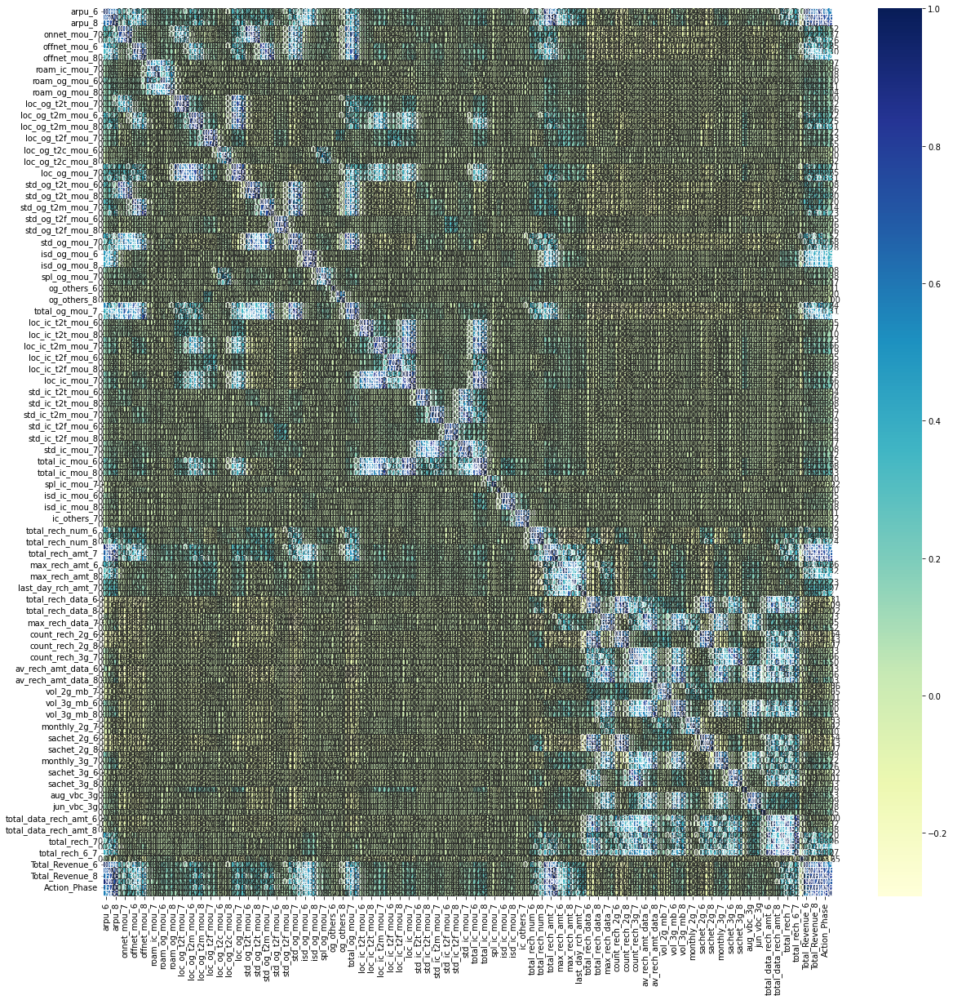

In [41]:
#Let's check the correlation for the dataset
plt.figure(figsize=(20,20))
sns.heatmap(hvc.corr(), annot=True, fmt=".2f", cmap="YlGnBu")
plt.show()

- It is very difficult to see the correlation of the variables. Let's check for the 80% correlated variables and map again

In [42]:
#Correlation matrix
corr_matrix = hvc.corr().abs()

#Selecting the upper triangle of the correlation matrix
upper_corr = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(np.bool))

#Feature columns with correlation greater than 0.80
high_corr_features = [col for col in upper_corr.columns if any(upper_corr[col]>0.80)]
print("Highly correlated features in dataset: {} \n \n {}".format(len(high_corr_features), high_corr_features))

Highly correlated features in dataset: 52 
 
 ['onnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'av_rech_amt_data_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'total_rech_6', 'total_rech_7', 'total_rech_8', 'total_rech_6_7', 'Total_Revenue_6', 'Total_Revenue_7', 'Total_Revenue_8', 'Good_Phase', 'Action_Phase']


- Around 52 variables are highly correlated to each other more than 80%

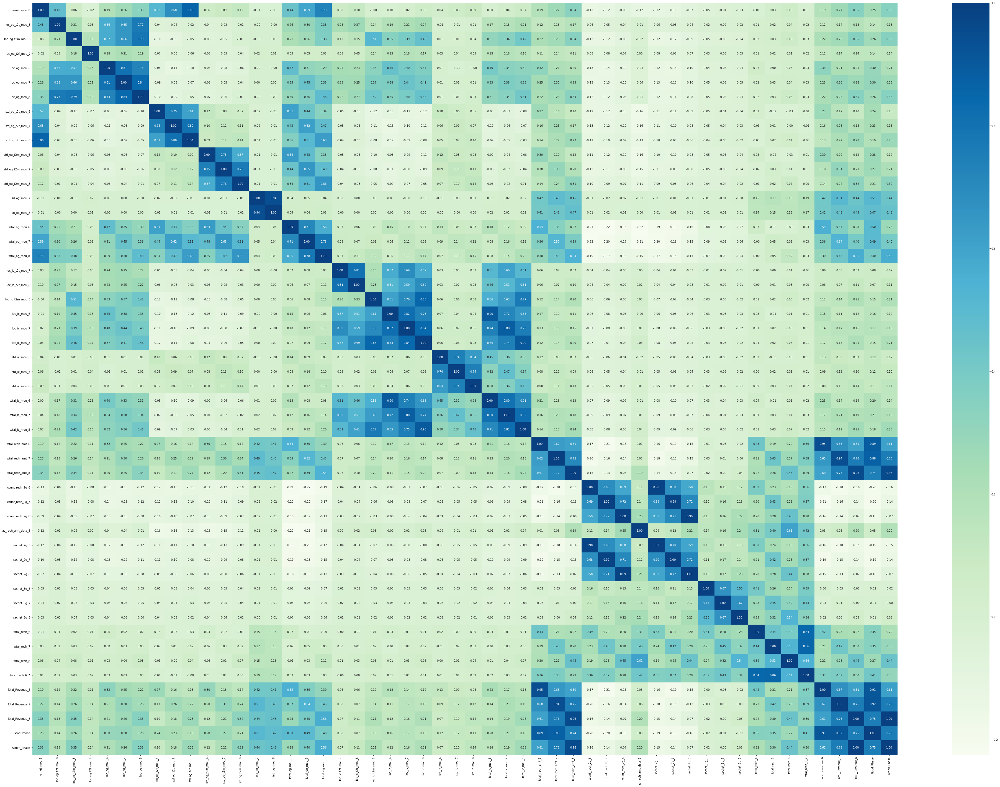

In [44]:
#Now let us check the correlation for the above highly correlated features and find the inferences.
new_corr = hvc[['onnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'av_rech_amt_data_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'total_rech_6', 'total_rech_7', 'total_rech_8', 'total_rech_6_7', 'Total_Revenue_6', 'Total_Revenue_7', 'Total_Revenue_8', 'Good_Phase', 'Action_Phase']]
plt.figure(figsize=(70,50))
sns.heatmap(new_corr.corr(), annot=True, fmt=".2f", cmap="GnBu")
plt.show()

#### Observations
- Good Phase is positively correlated with total recharge amount of 6th and 7th months is 0.89 and 0.88 respectively.
- Action Phase is positively correlated with total recharge amount of 8th month (0.96)
- Total recharge amount of all months (June, July and August) are highly correlated with the total revenue of all months (0.95, 0.94, 0.96) respectively.
- Within same telecom operator, local incoming calls minutes of usage for June, July and August months are highly correlated with total incoming calls minutes of usage 0.90, 0.88, 0.90 respectively.


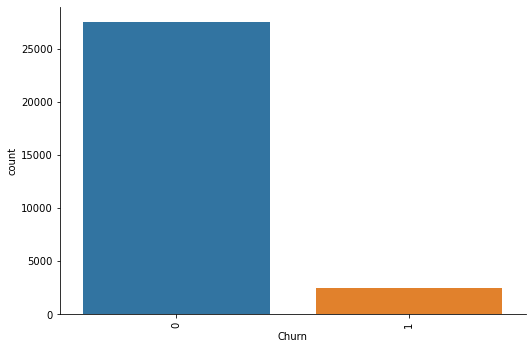

In [45]:
#Check the churn in a graphical way
churn_grap_plt = sns.catplot("Churn", data=hvc, aspect=1.5, kind="count")
churn_grap_plt.set_xticklabels(rotation=90)
plt.show()

In [46]:
hvc.shape

(30001, 154)

In [47]:
#List all the columns in hvc 
list(hvc.columns)

['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t

In [48]:
#Derive few more variables 
hvc['roam_any_6'] = hvc[['roam_ic_mou_6', 'roam_og_mou_6']].sum(axis = 1)
hvc['roam_any_7'] = hvc[['roam_ic_mou_7', 'roam_og_mou_7']].sum(axis = 1)
hvc['roam_any_8'] = hvc[['roam_ic_mou_8', 'roam_og_mou_8']].sum(axis = 1)

hvc['roam_any_6'] = hvc['roam_any_6'].apply(lambda x: 1 if (x>0) else 0)
hvc['roam_any_7'] = hvc['roam_any_7'].apply(lambda x: 1 if (x>0) else 0)
hvc['roam_any_8'] = hvc['roam_any_8'].apply(lambda x: 1 if (x>0) else 0)

## Add all local ic and og columns and add a new column which says if local value is true for data
hvc['local_any_6'] = hvc[['loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6']].sum(axis=1)
hvc['local_any_7'] = hvc[['loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7']].sum(axis=1)
hvc['local_any_8'] = hvc[['loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8']].sum(axis=1)

hvc['local_any_6'] = hvc['local_any_6'].apply(lambda x: 1 if (x > 0) else 0)
hvc['local_any_7'] = hvc['local_any_7'].apply(lambda x: 1 if (x > 0) else 0)
hvc['local_any_8'] = hvc['local_any_8'].apply(lambda x: 1 if (x > 0) else 0)

## Add all std ic and og columns and add a new column which says if std value is true for data
hvc['std_any_6'] = hvc[['std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6']].sum(axis=1)
hvc['std_any_7'] = hvc[['std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7', 'std_ic_mou_7']].sum(axis=1)
hvc['std_any_8'] = hvc[['std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8']].sum(axis=1)

hvc['std_any_6'] = hvc['std_any_6'].apply(lambda x: 1 if (x > 0) else 0)
hvc['std_any_7'] = hvc['std_any_7'].apply(lambda x: 1 if (x > 0) else 0)
hvc['std_any_8'] = hvc['std_any_8'].apply(lambda x: 1 if (x > 0) else 0)

## Add all isd & spl ic and og columns and add a new column which says if spl value is true for data
hvc['spl_any_6'] = hvc[['isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6']].sum(axis=1)
hvc['spl_any_7'] = hvc[['isd_og_mou_7', 'spl_og_mou_7', 'og_others_7', 'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7']].sum(axis=1)
hvc['spl_any_8'] = hvc[['isd_og_mou_8', 'spl_og_mou_8', 'og_others_8', 'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8']].sum(axis=1)

hvc['spl_any_6'] = hvc['spl_any_6'].apply(lambda x: 1 if (x > 0) else 0)
hvc['spl_any_7'] = hvc['spl_any_7'].apply(lambda x: 1 if (x > 0) else 0)
hvc['spl_any_8'] = hvc['spl_any_8'].apply(lambda x: 1 if (x > 0) else 0)

## Data used 2g and 3g
hvc['data_used_6'] = hvc[['vol_2g_mb_6', 'vol_3g_mb_6', 'jun_vbc_3g']].sum(axis=1)
hvc['data_used_7'] = hvc[['vol_2g_mb_7', 'vol_3g_mb_7', 'jul_vbc_3g']].sum(axis=1)
hvc['data_used_8'] = hvc[['vol_2g_mb_8', 'vol_3g_mb_8', 'aug_vbc_3g']].sum(axis=1)


In [49]:
#Drop the unwanted columns
hvc = hvc.drop(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_og_mou_6', 'roam_ic_mou_7', 'roam_og_mou_7', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7', 'std_ic_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'isd_og_mou_7', 'spl_og_mou_7', 'og_others_7', 'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8', 'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8', 'vol_2g_mb_6', 'vol_3g_mb_6', 'jun_vbc_3g', 'vol_2g_mb_7', 'vol_3g_mb_7', 'jul_vbc_3g', 'vol_2g_mb_8', 'vol_3g_mb_8', 'aug_vbc_3g', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'total_data_rech_amt_6', 'total_data_rech_amt_7', 'total_data_rech_amt_8', 'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8'], axis=1)

In [50]:
hvc.shape

(30001, 52)

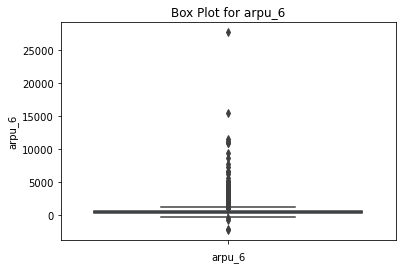

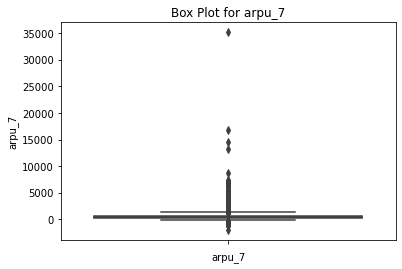

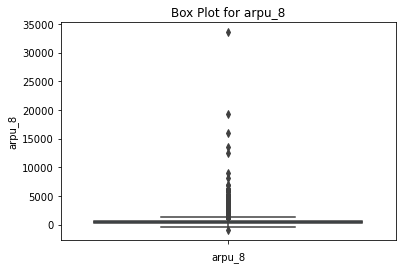

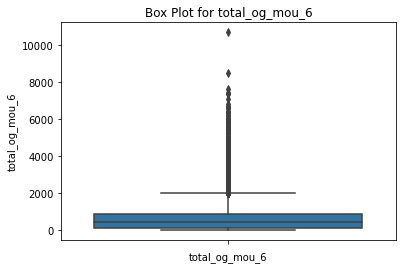

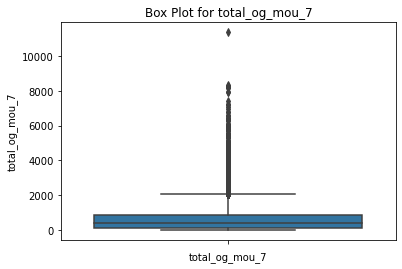

...

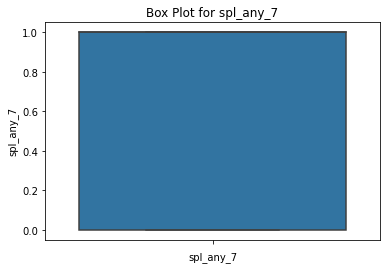

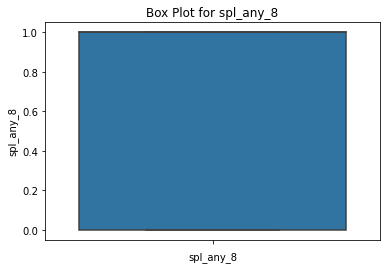

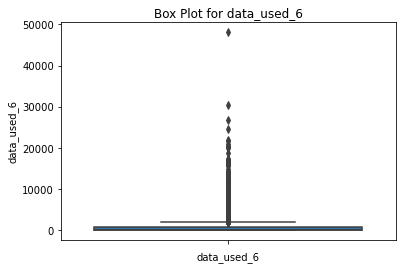

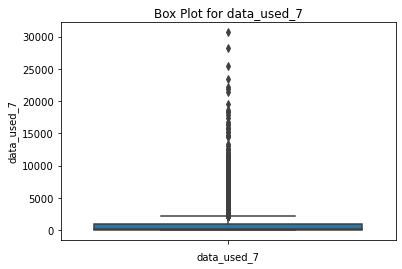

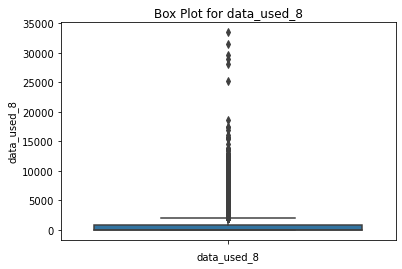

In [51]:
#plotting the numerical columns 
num_var = [col for col in hvc.columns if col not in ['Churn']]

for col in num_var:
    sns.boxplot(y=col, data=hvc)
    plt.title('Box Plot for '+col)
    plt.xlabel(col)
    plt.show()

- We could see that lot of outliers are there in the dataset. Variables such as Good Phase, Action Phase, Churn Phase, the total revenue variables of all the months and all other variables are normally distributed.

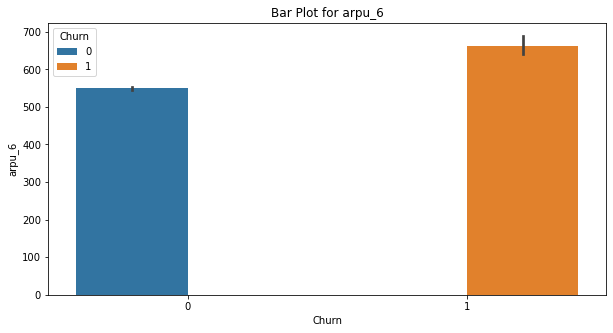

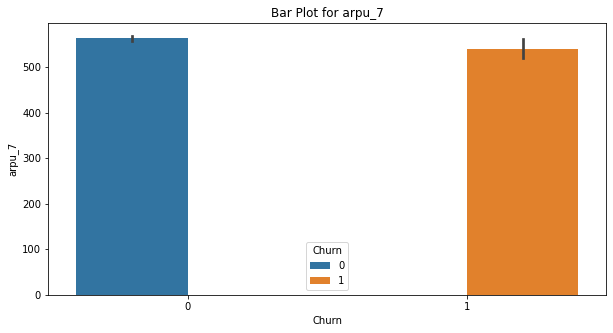

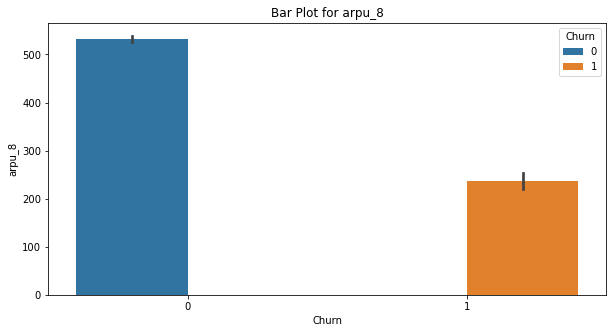

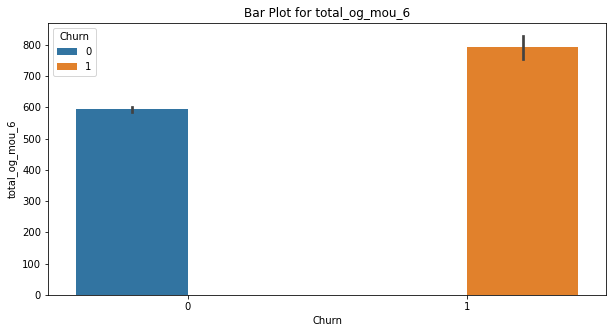

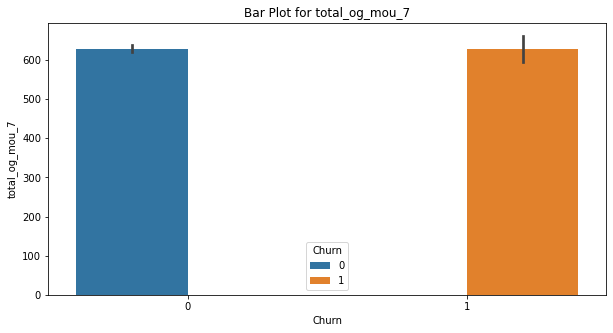

...

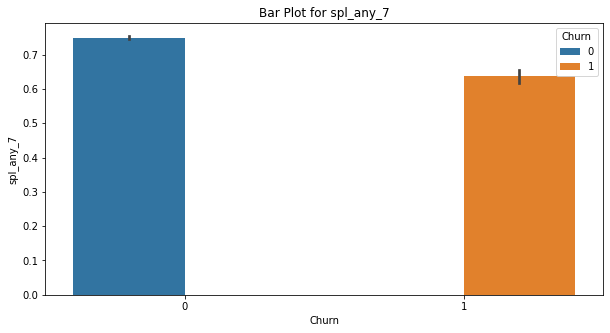

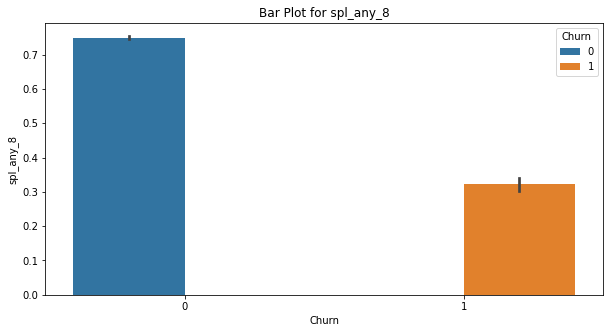

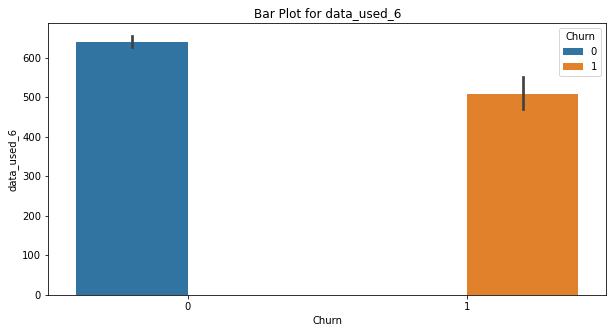

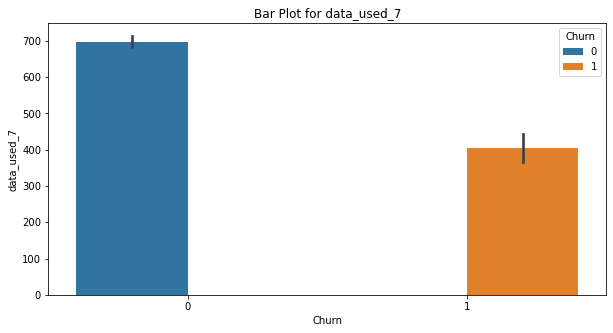

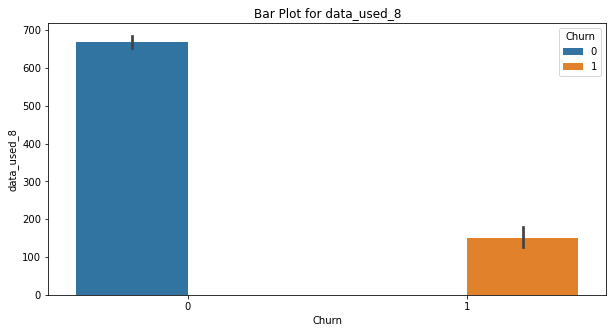

In [52]:
#Let us check the churn as the target with the other variables
num_var = [col for col in hvc.columns if col not in ['Churn']]

for col in num_var:
    plt.figure(figsize=(10,5))
    sns.barplot(x='Churn', y=col, data=hvc, hue='Churn')
    plt.title('Bar Plot for '+col)
    plt.show()

#### Observations
- Average revenue per user for June month has higher churn rate compared to July and August months.
- Total outgoing calls (Minutes of usage) for June month has higher churn rate compared to `July and August month.
- Last day recharge amount for June month has higher churn rate compared to July and August months.
- Non churn rate for total incoming calls (minutes of usage) has higher percentage than churn rate. If we want to compare the churn rate for all the months then June month has the higher rate.
- Service schemes with validity smaller than a month (2g) for June month has higher churn rate compared to July and August months.
- Monthly 3g data for June month has higher churn rate compared to July and August months.
- Service schemes with validity smaller than a month (3g) for June month has higher churn rate compared to July and August months.
- Total recharge for June month has higher churn rate compared to July and August month.
- Total revenue for the month of June is higher compared to July and August months.
- Good Phase has higher churn rate compared to Action Phase.
- Roaming for the August month is higher compared to June and July month.

<Figure size 720x360 with 0 Axes>

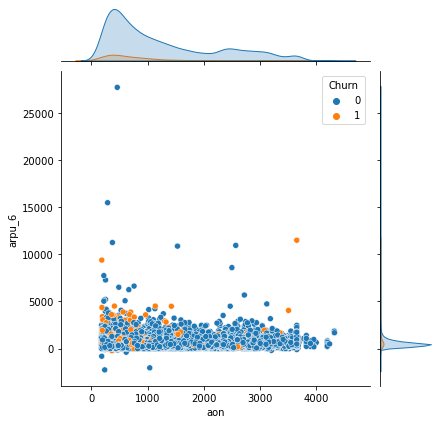

<Figure size 720x360 with 0 Axes>

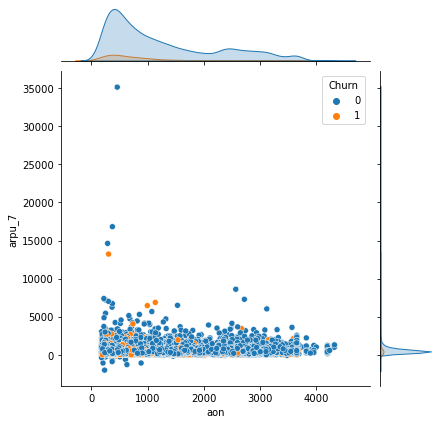

<Figure size 720x360 with 0 Axes>

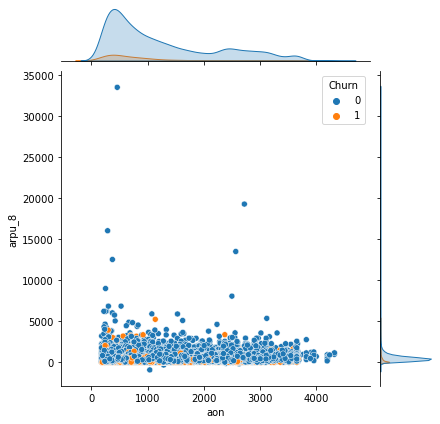

<Figure size 720x360 with 0 Axes>

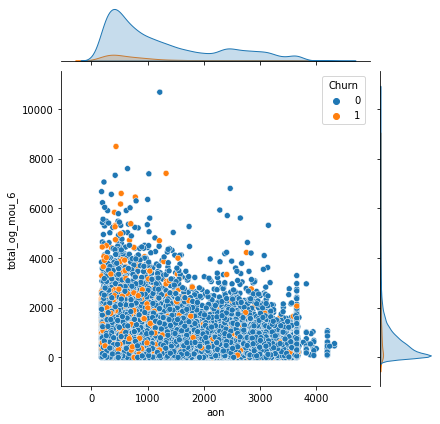

<Figure size 720x360 with 0 Axes>

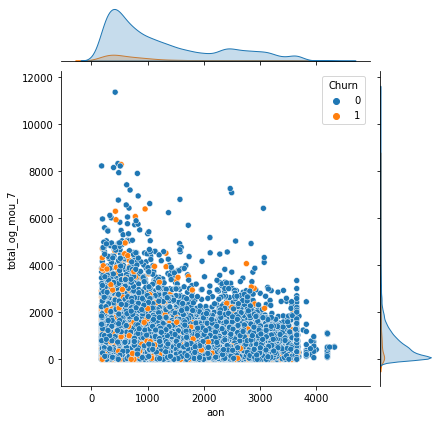

<Figure size 720x360 with 0 Axes>

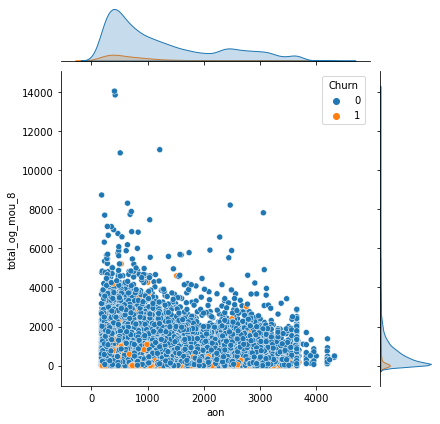

<Figure size 720x360 with 0 Axes>

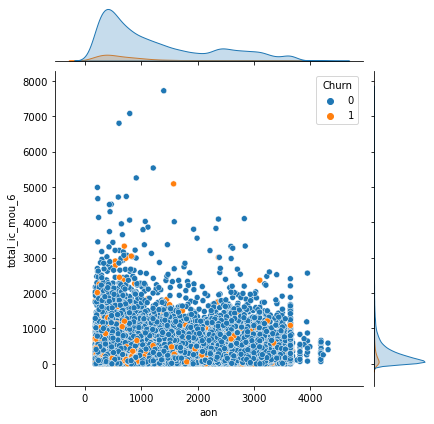

<Figure size 720x360 with 0 Axes>

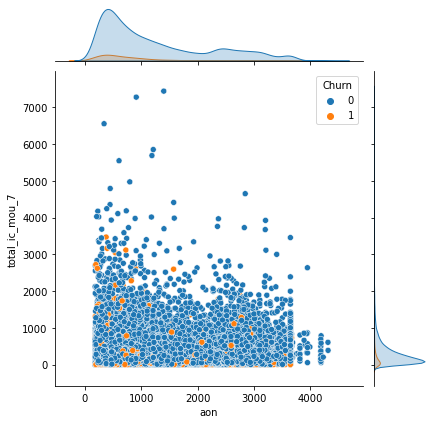

<Figure size 720x360 with 0 Axes>

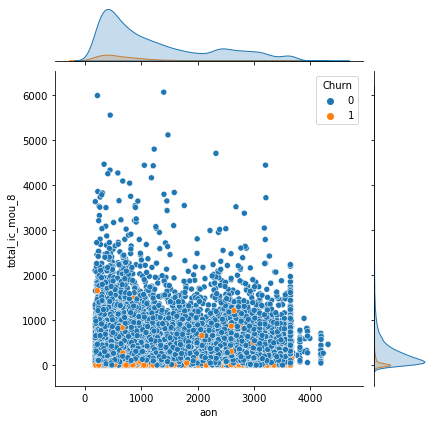

<Figure size 720x360 with 0 Axes>

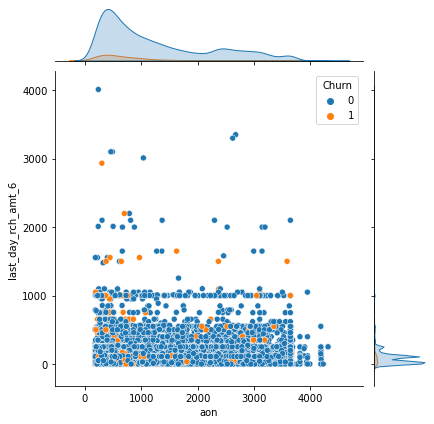

<Figure size 720x360 with 0 Axes>

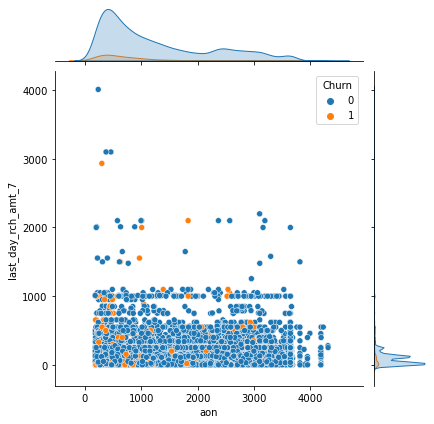

<Figure size 720x360 with 0 Axes>

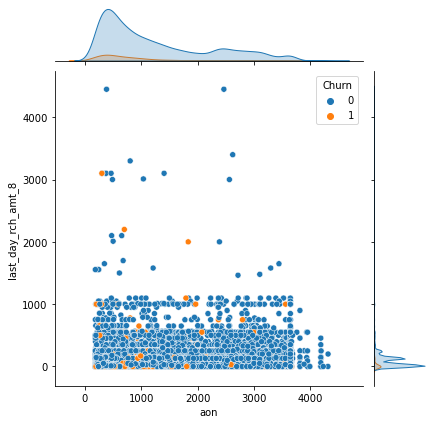

<Figure size 720x360 with 0 Axes>

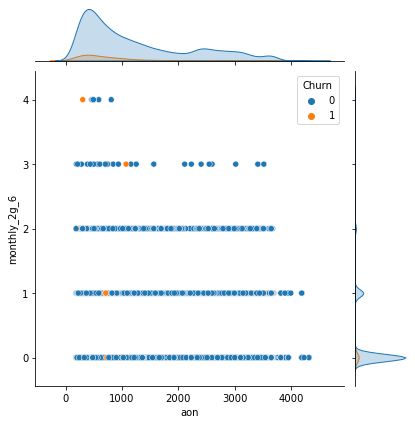

<Figure size 720x360 with 0 Axes>

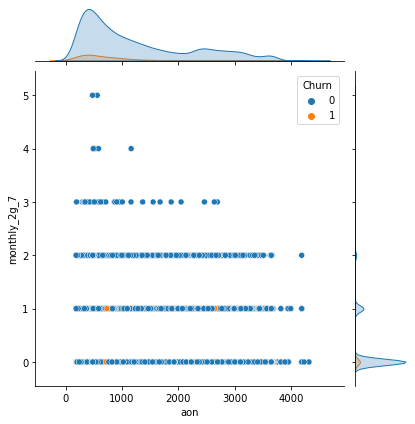

<Figure size 720x360 with 0 Axes>

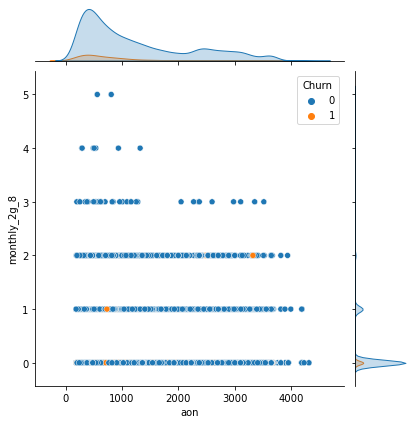

<Figure size 720x360 with 0 Axes>

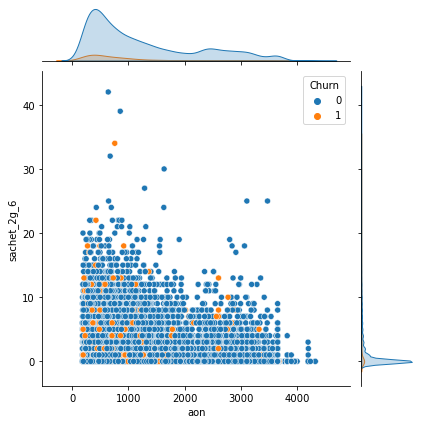

<Figure size 720x360 with 0 Axes>

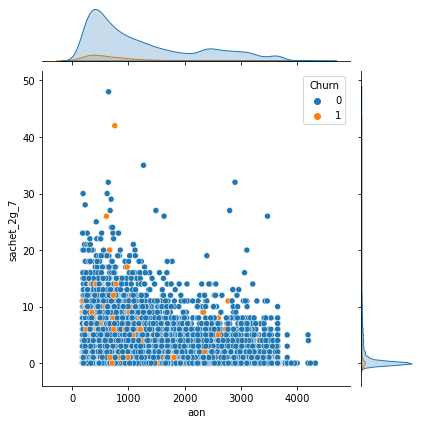

<Figure size 720x360 with 0 Axes>

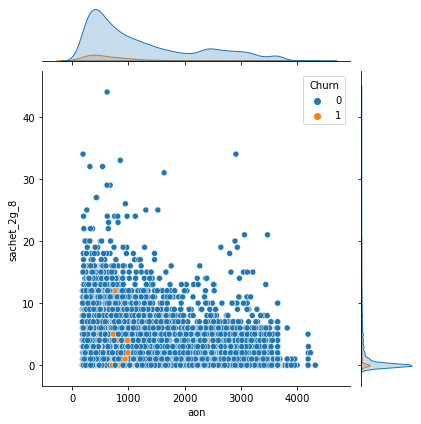

<Figure size 720x360 with 0 Axes>

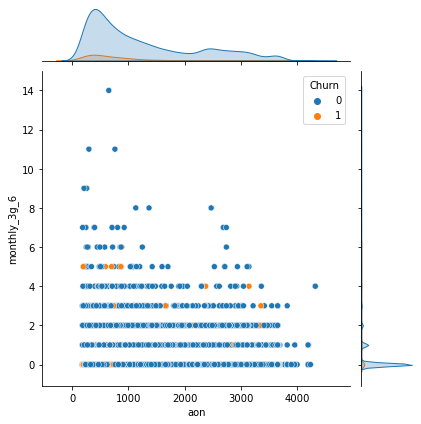

<Figure size 720x360 with 0 Axes>

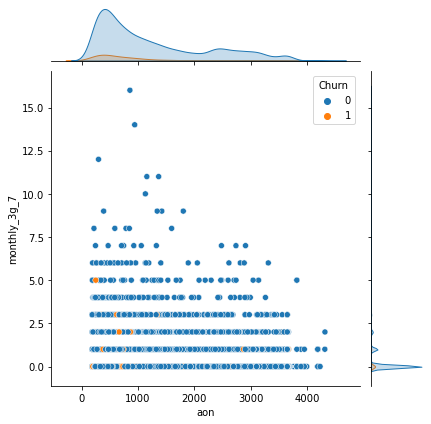

<Figure size 720x360 with 0 Axes>

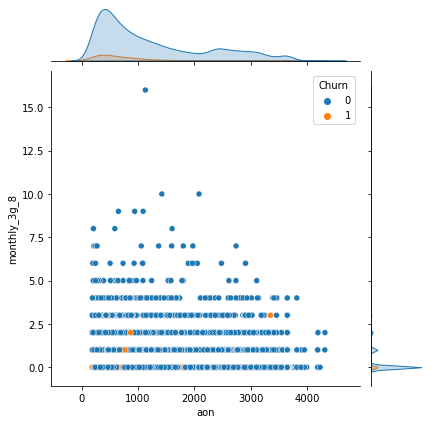

<Figure size 720x360 with 0 Axes>

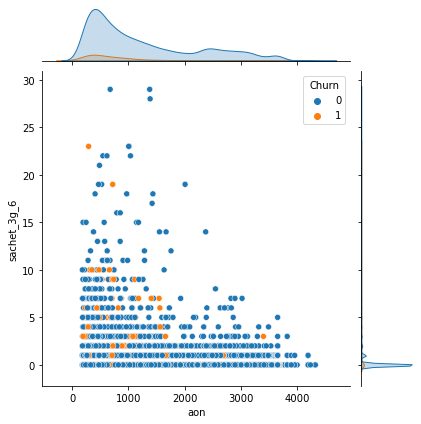

<Figure size 720x360 with 0 Axes>

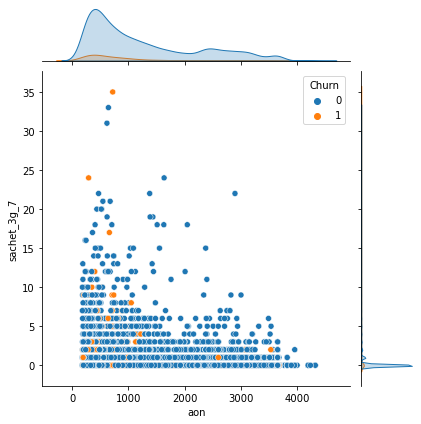

<Figure size 720x360 with 0 Axes>

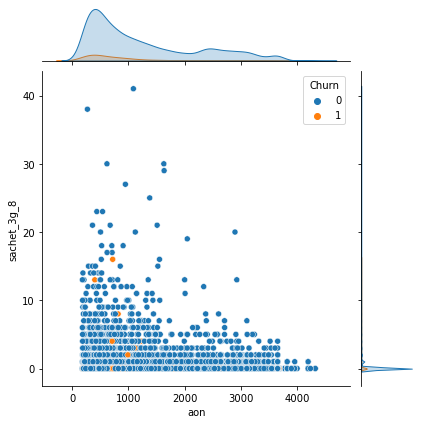

<Figure size 720x360 with 0 Axes>

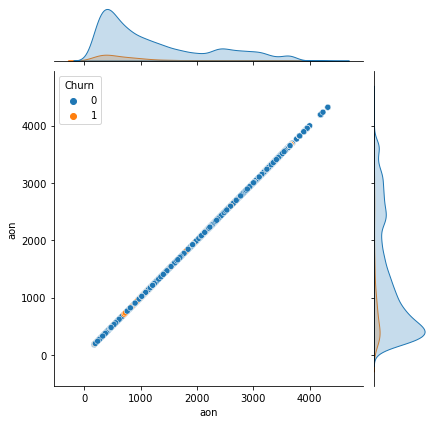

<Figure size 720x360 with 0 Axes>

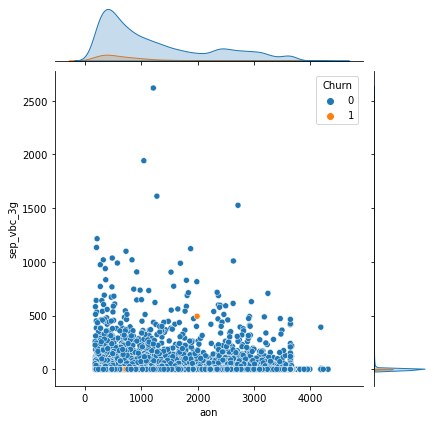

<Figure size 720x360 with 0 Axes>

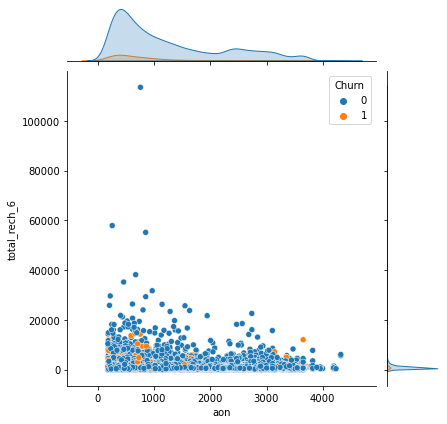

<Figure size 720x360 with 0 Axes>

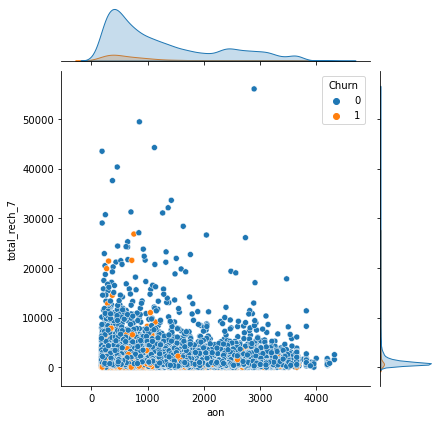

<Figure size 720x360 with 0 Axes>

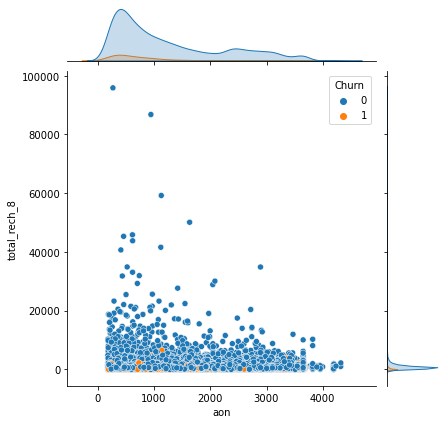

<Figure size 720x360 with 0 Axes>

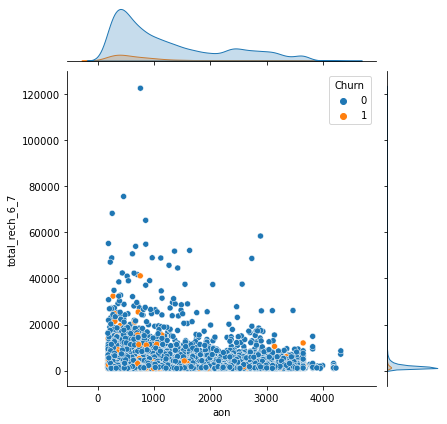

<Figure size 720x360 with 0 Axes>

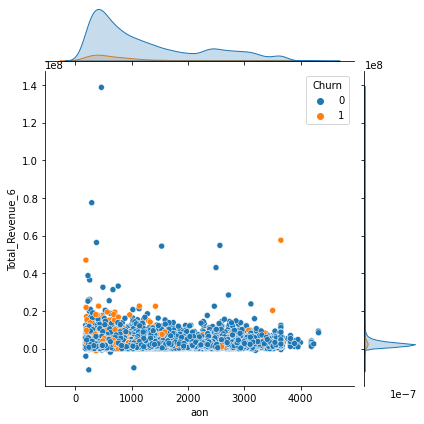

<Figure size 720x360 with 0 Axes>

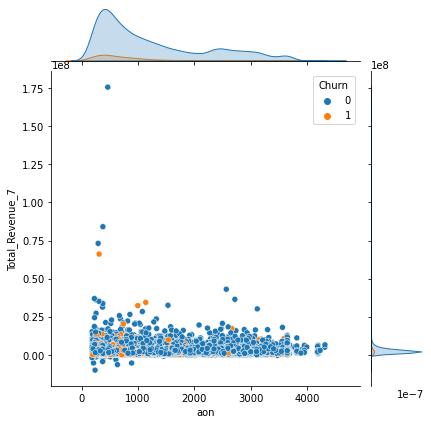

<Figure size 720x360 with 0 Axes>

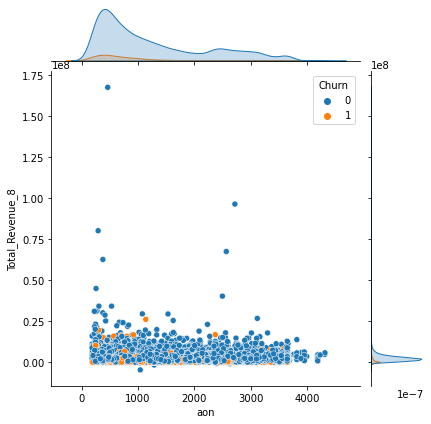

<Figure size 720x360 with 0 Axes>

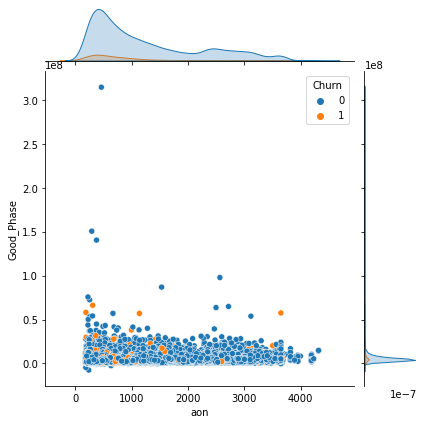

<Figure size 720x360 with 0 Axes>

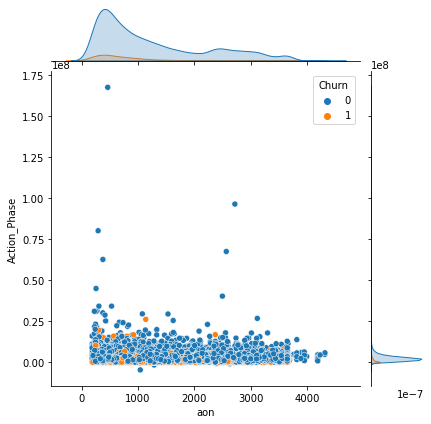

<Figure size 720x360 with 0 Axes>

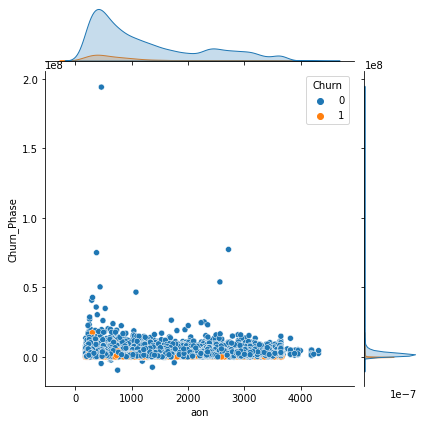

<Figure size 720x360 with 0 Axes>

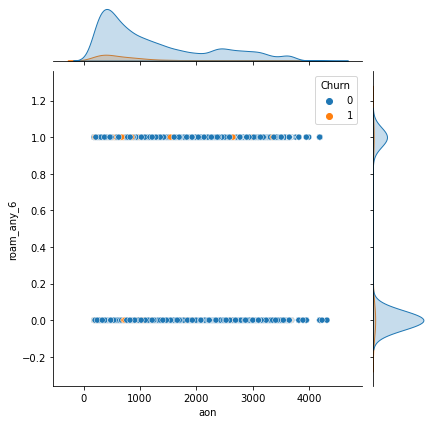

<Figure size 720x360 with 0 Axes>

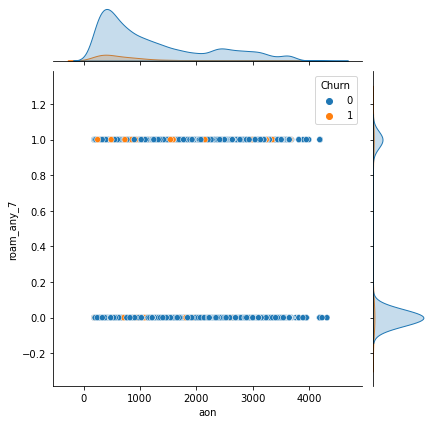

<Figure size 720x360 with 0 Axes>

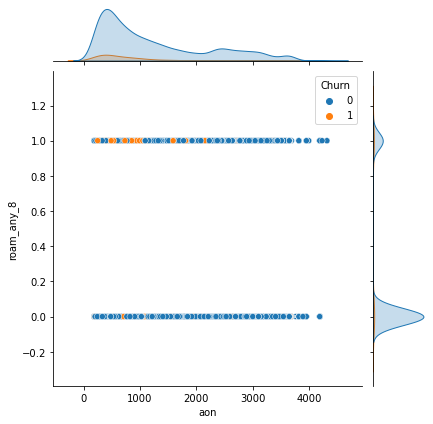

<Figure size 720x360 with 0 Axes>

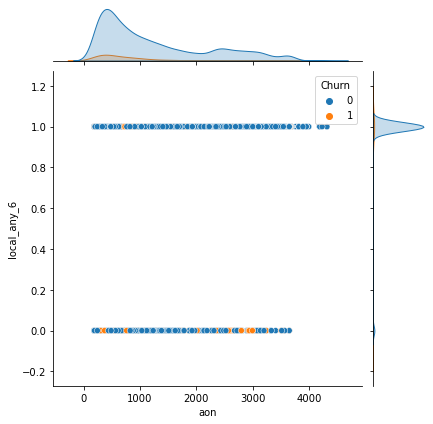

<Figure size 720x360 with 0 Axes>

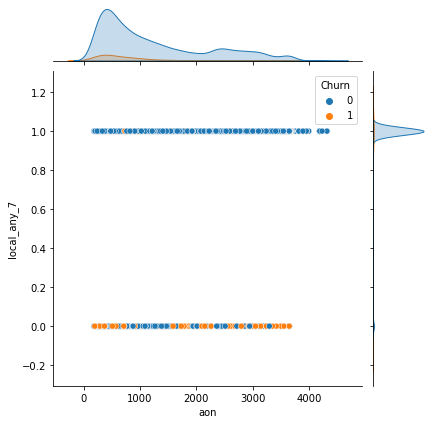

<Figure size 720x360 with 0 Axes>

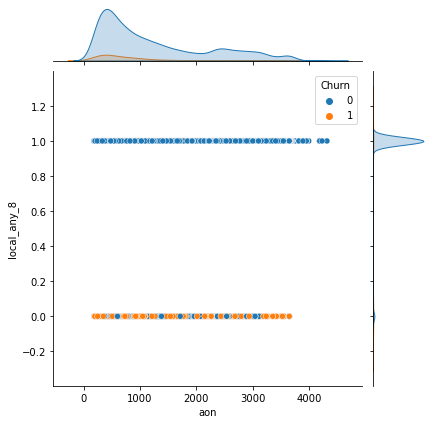

<Figure size 720x360 with 0 Axes>

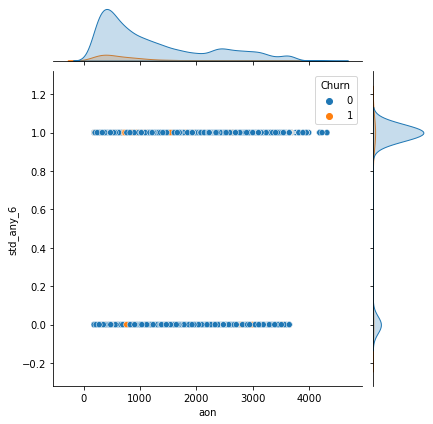

<Figure size 720x360 with 0 Axes>

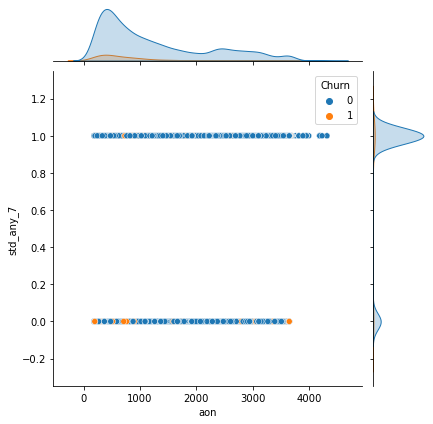

<Figure size 720x360 with 0 Axes>

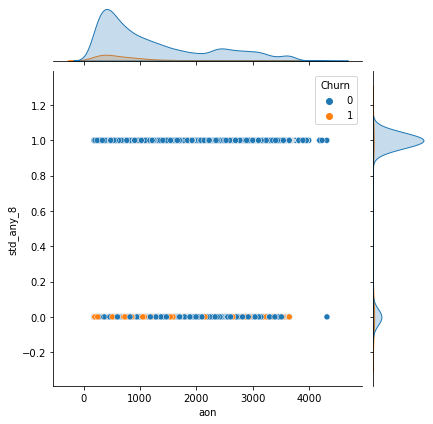

<Figure size 720x360 with 0 Axes>

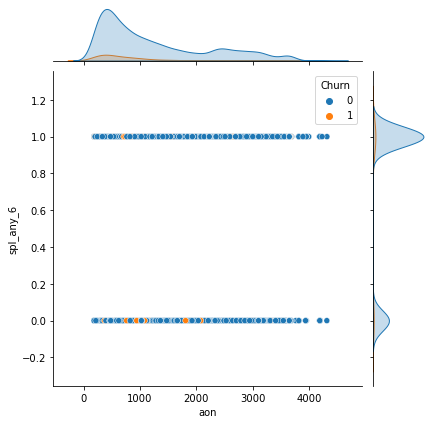

<Figure size 720x360 with 0 Axes>

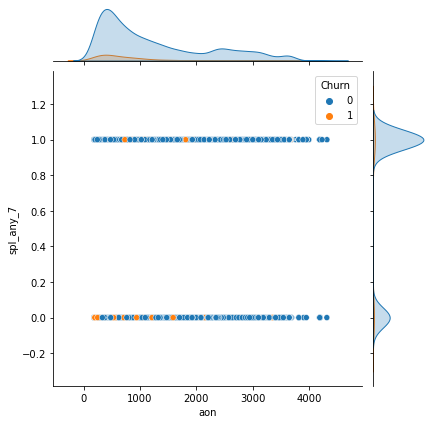

<Figure size 720x360 with 0 Axes>

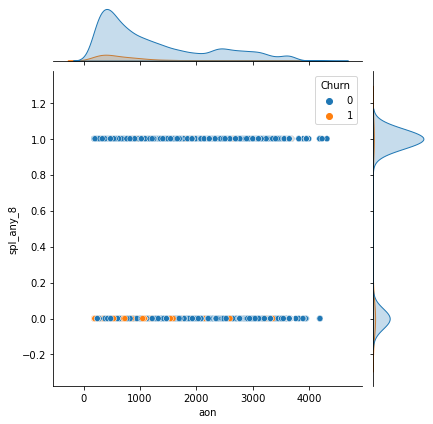

<Figure size 720x360 with 0 Axes>

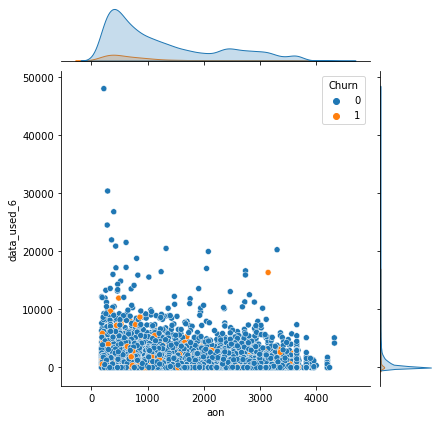

<Figure size 720x360 with 0 Axes>

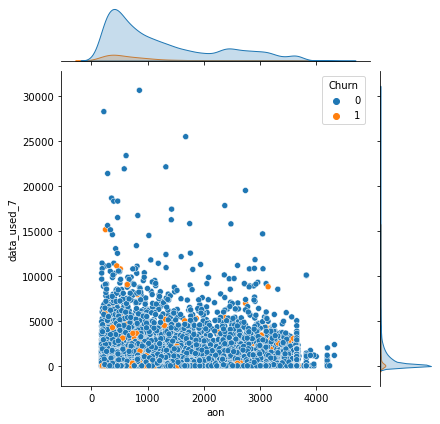

<Figure size 720x360 with 0 Axes>

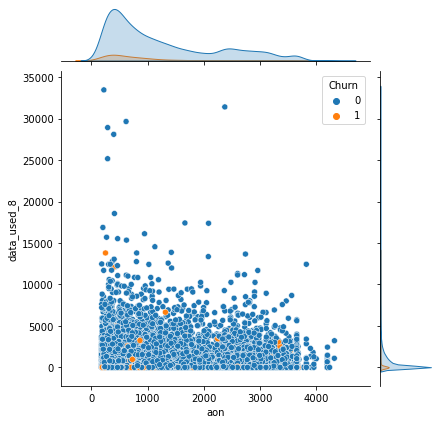

In [53]:
#Check the Age of network used by the operator vs. the other variables except churn.
num_var = [col for col in hvc.columns if col not in ['Churn']]

for col in num_var:
    plt.figure(figsize=(10,5))
    sns.jointplot(x='aon', y=col, data=hvc, hue='Churn')
    plt.show()

### Model Building

In [54]:
#Import the libraries that are required for model building
from sklearn.model_selection import train_test_split
import sklearn.preprocessing
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler

In [55]:
#Putting feature variables in X and response/target variables in y
X = hvc.drop(['Churn'], axis=1)
y = hvc['Churn']

In [56]:
#Split the data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [57]:
#Scaling
scaler = MinMaxScaler()

#Fitting and transforming the scale on train
X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

#### Imbalanced Data Handling using SMOTE
#### SMOTE - Synthetic Minority Over-sampling Technique
- This technique is followed to avoid overfitting which occurs when exact replicas of minority instances are added to the main dataset. A subset of data is taken from the minority class as an example and then new synthetic similar instances are created. These synthetic instances are then added to the original dataset. The new dataset is used as a sample to train the classification models.

#### Advantages
- Mitigates the problem of overfitting caused by random oversampling as synthetic examples are generated rather than replication of instances.
- No loss of useful information.

In [58]:
#Check the sample before for 0 and 1
print("Before sample the count of label '1' : {}".format(sum(y_train==1)))
print("Before sample the count of label '0' : {}".format(sum(y_train==0)))
print("Before sample churn event rate : {}% \n".format(round(sum(y_train==1)/len(y_train)*100,2)))

Before sample the count of label '1' : 1691
Before sample the count of label '0' : 19309
Before sample churn event rate : 8.05% 



In [67]:
#Import the SMOTE and Joblib for solving this issue of imbalance
from imblearn.over_sampling import SMOTE
from scipy import sparse

sm = SMOTE(random_state=12)
X_train_re, y_train_re = sm.fit_resample(X_train, y_train)

- From the above, I have used fit_resample instead of fit_sample because when I used fit_sample, it throws an error saying "AttributeError: ‘SMOTE’ object has no attribute ‘fit_sample’ error". By fitting the SMOTE object to data before using the fit_sample method, we can avoid this error and use the SMOTE class as intended. 

In [69]:
#Check the sample after for 0 and 1
print("After sample the count of label '1' : {}".format(sum(y_train_re==1)))
print("After sample the count of label '0' : {}".format(sum(y_train_re==0)))
print("After sample churn event rate : {}% \n".format(round(sum(y_train_re==1)/len(y_train_re)*100,2)))

After sample the count of label '1' : 19309
After sample the count of label '0' : 19309
After sample churn event rate : 50.0% 



- Now we can see that the data is 50% balanced. Let us do the outlier analysis and proceed further

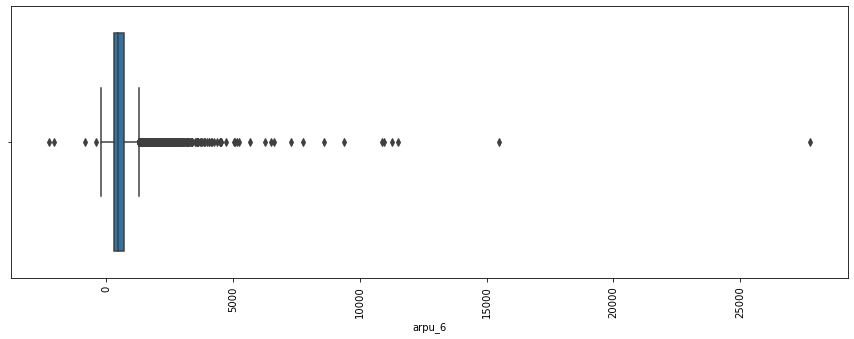

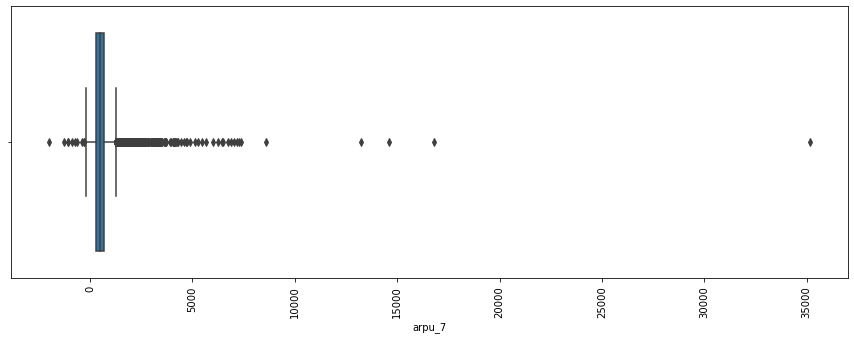

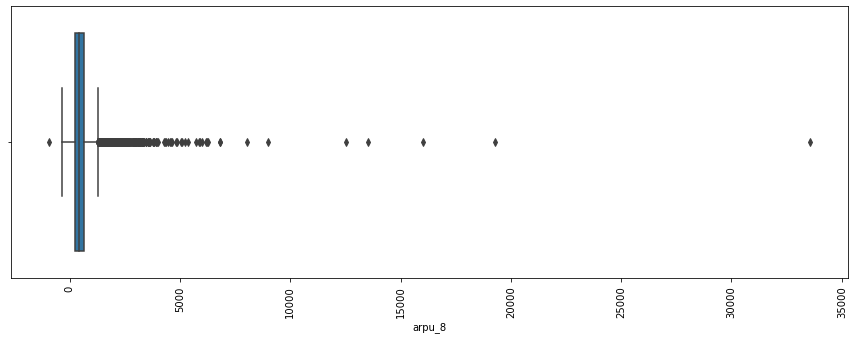

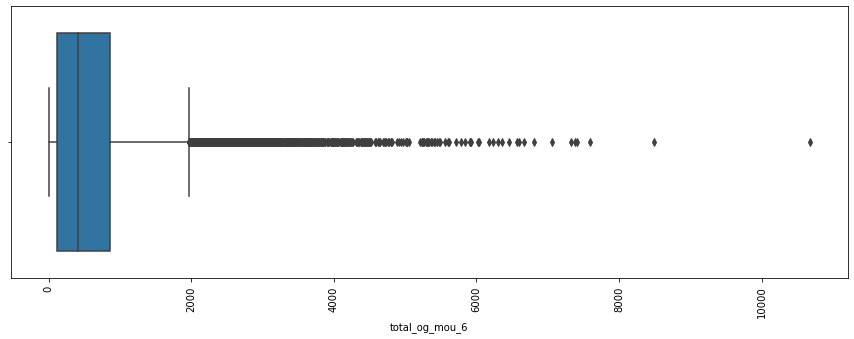

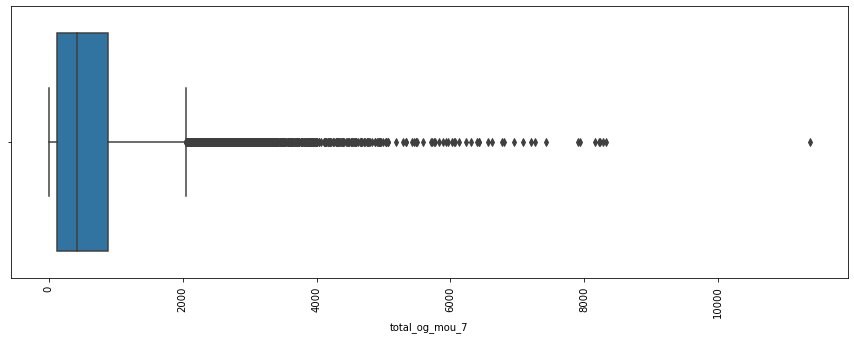

...

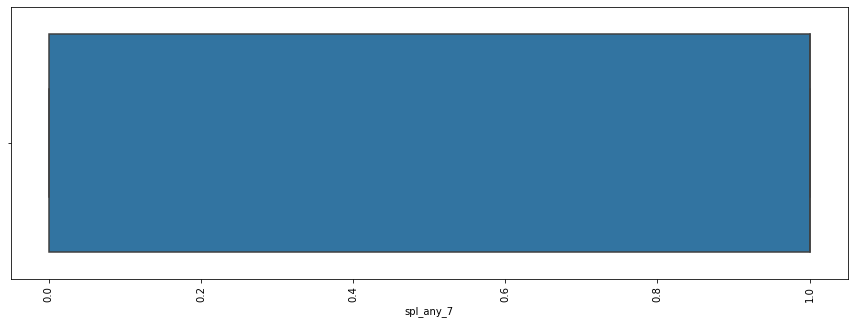

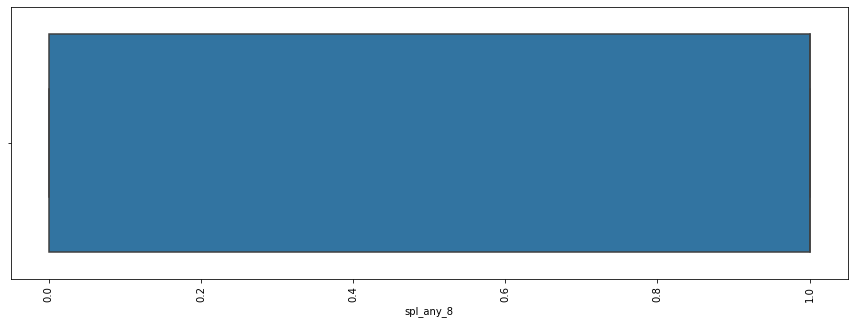

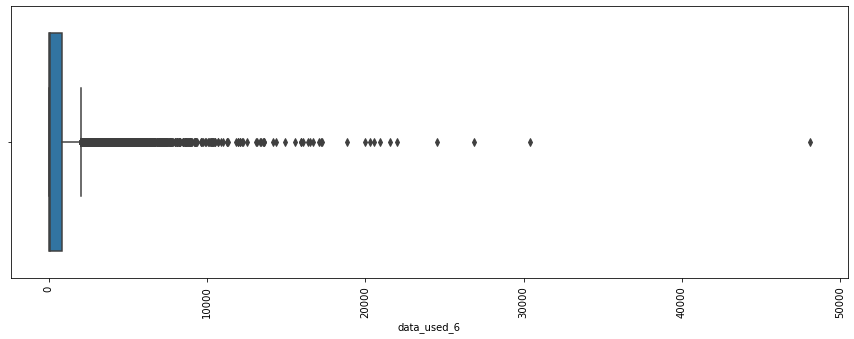

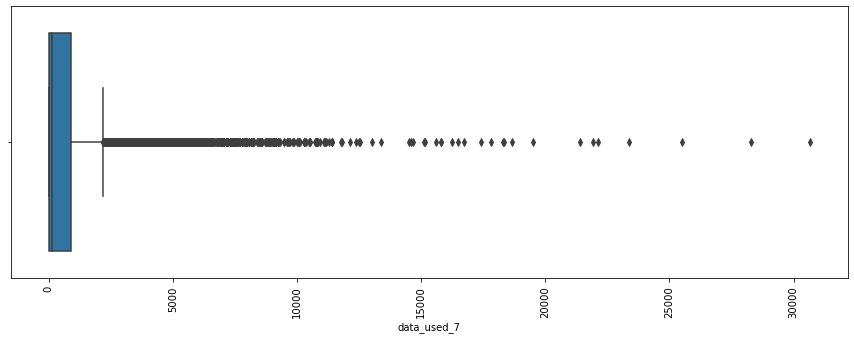

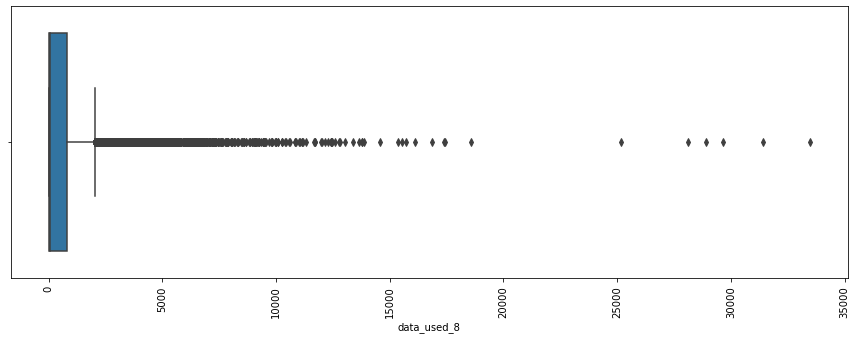

In [70]:
#Outlier treatment for high valued customers as we use only those customers for modelling
check_outliers = list(hvc.columns)
for i in hvc[check_outliers]:
    plt.figure(1,figsize=(15,5))
    sns.boxplot(hvc[i])
    plt.xticks(rotation=90, fontsize=10)
    plt.show()

- We could see almost all the variables are having the outliers present in the dataset. So let's remove the outliers

Outliers :  arpu_6 -1209.8735000000001 2316.4825


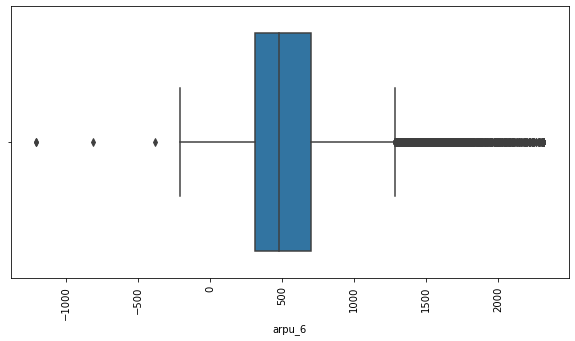

Outliers :  arpu_7 -1208.106 2318.238


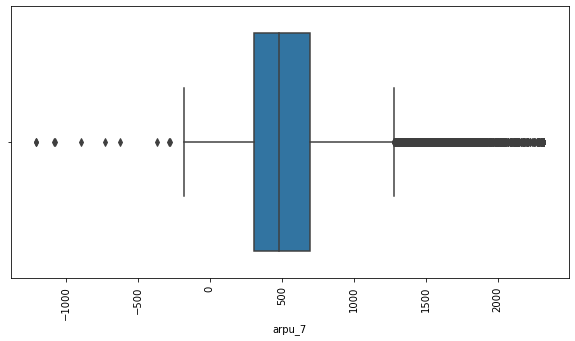

Outliers :  arpu_8 -1442.1425000000002 2429.0375000000004


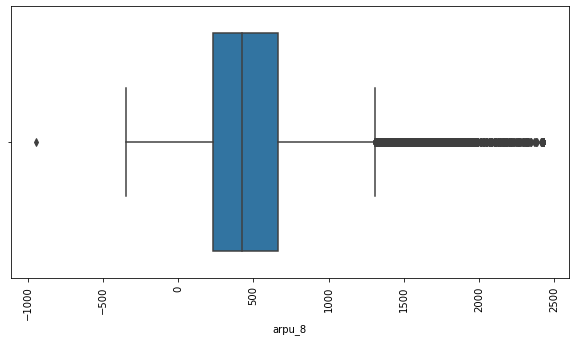

Outliers :  total_og_mou_6 -2170.62 3617.7


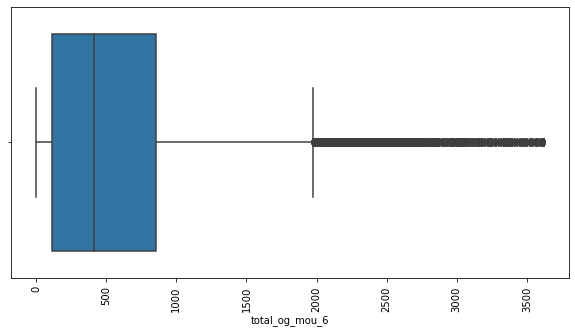

Outliers :  total_og_mou_7 -2221.7400000000002 3702.9000000000005


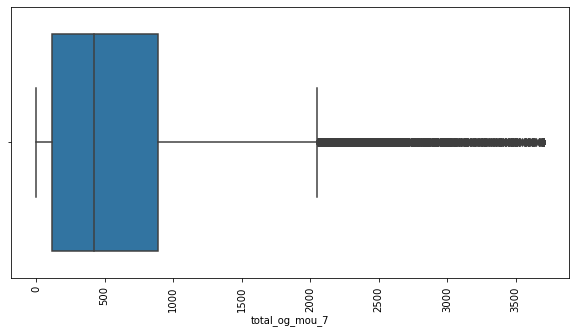

Outliers :  total_og_mou_8 -2039.3849999999998 3398.9749999999995


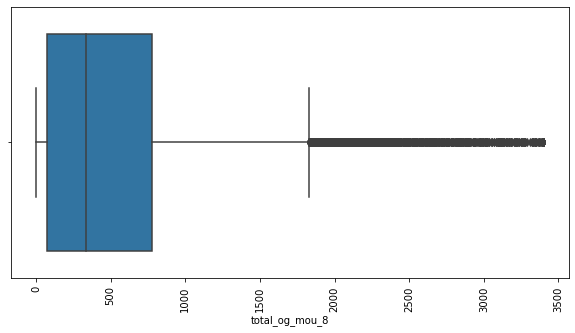

Outliers :  total_ic_mou_6 -994.5150000000001 1660.8850000000002


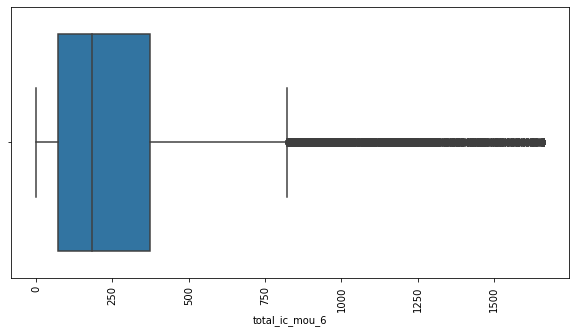

Outliers :  total_ic_mou_7 -1003.7449999999999 1679.415


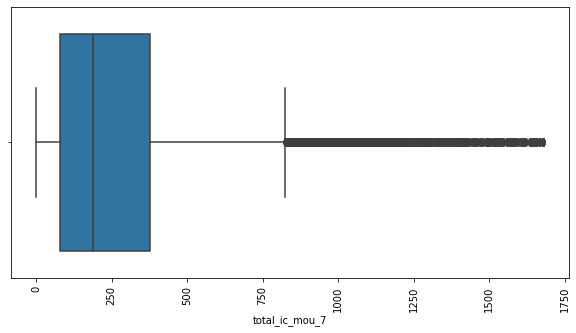

Outliers :  total_ic_mou_8 -975.345 1625.575


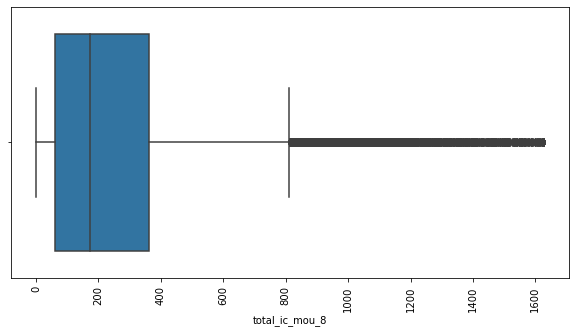

Outliers :  last_day_rch_amt_6 -375.0 625.0


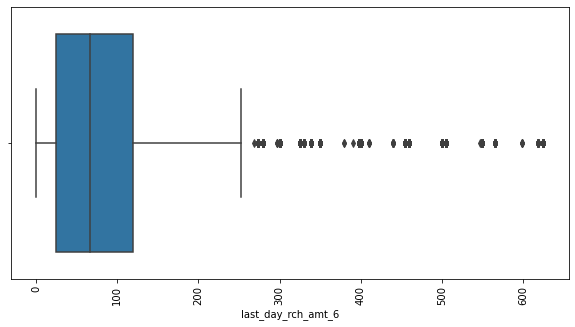

Outliers :  last_day_rch_amt_7 -375.0 625.0


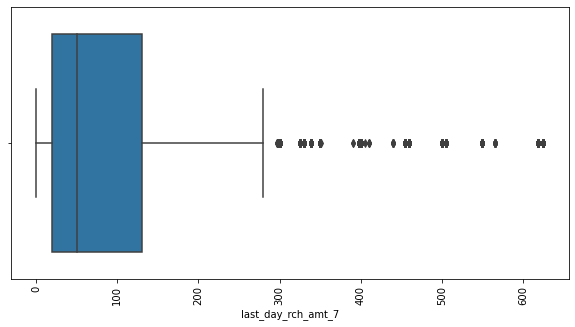

Outliers :  last_day_rch_amt_8 -337.5 562.5


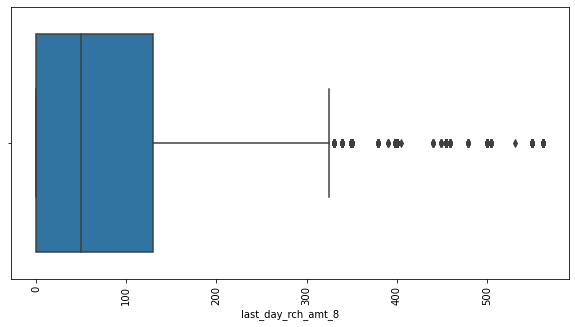

Outliers :  monthly_2g_6 -1.5 2.5


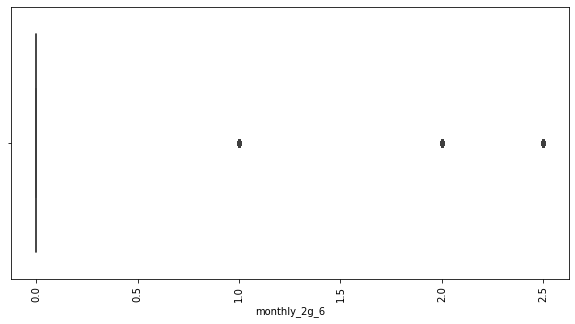

Outliers :  monthly_2g_7 -1.5 2.5


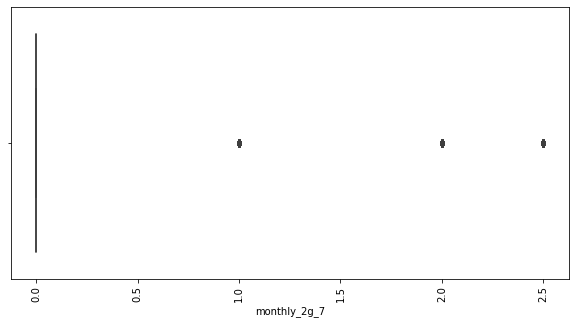

Outliers :  monthly_2g_8 -1.5 2.5


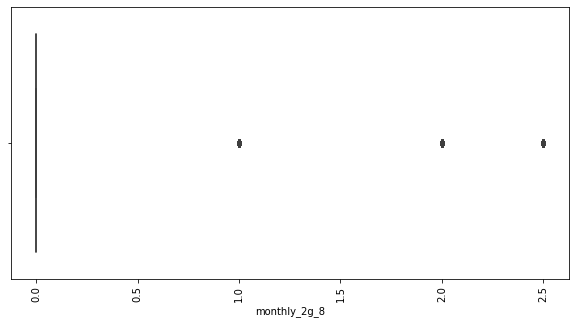

Outliers :  sachet_2g_6 -6.0 10.0


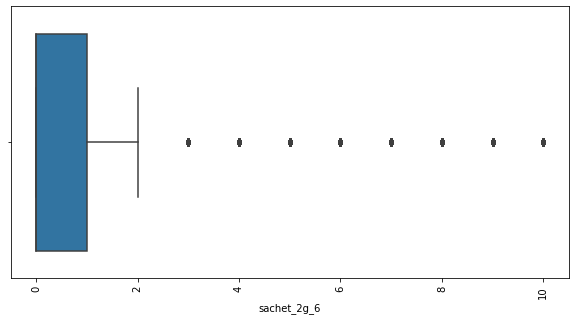

Outliers :  sachet_2g_7 -7.5 12.5


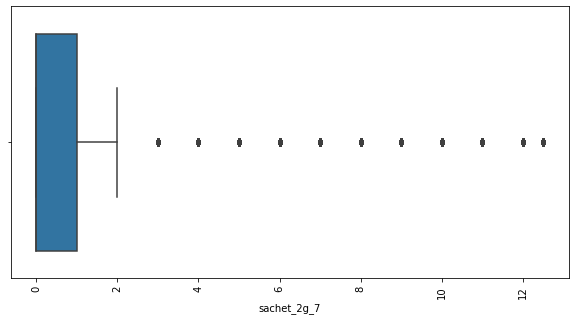

Outliers :  sachet_2g_8 -6.0 10.0


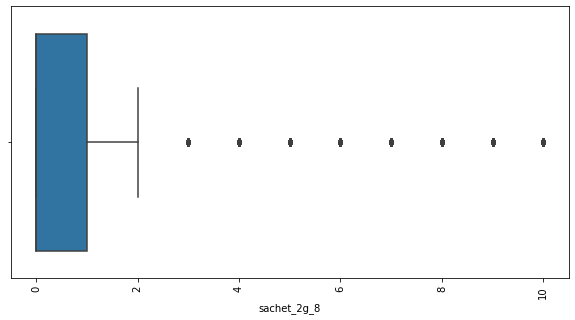

Outliers :  monthly_3g_6 -1.5 2.5


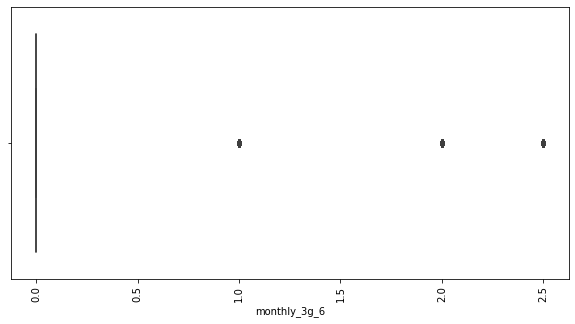

Outliers :  monthly_3g_7 -1.5 2.5


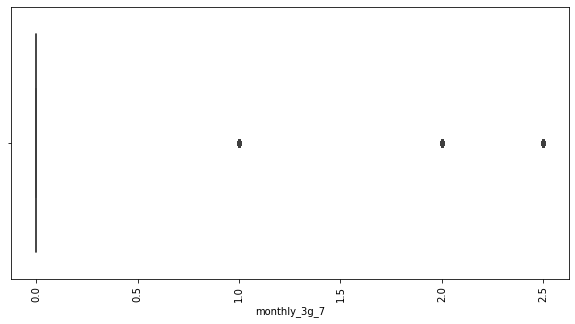

Outliers :  monthly_3g_8 -1.5 2.5


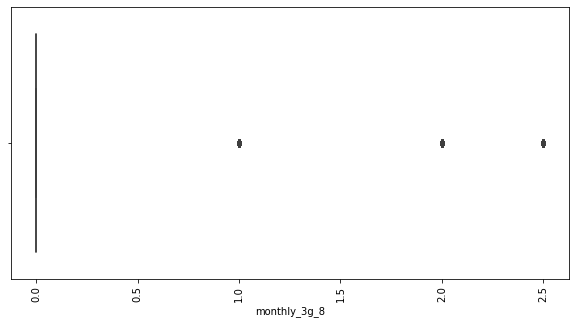

Outliers :  sachet_3g_6 -1.5 2.5


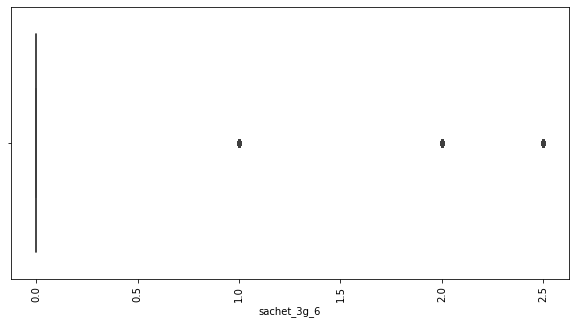

Outliers :  sachet_3g_7 -1.5 2.5


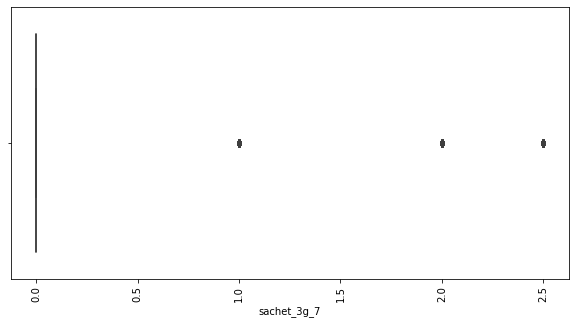

Outliers :  sachet_3g_8 0.0 0.0


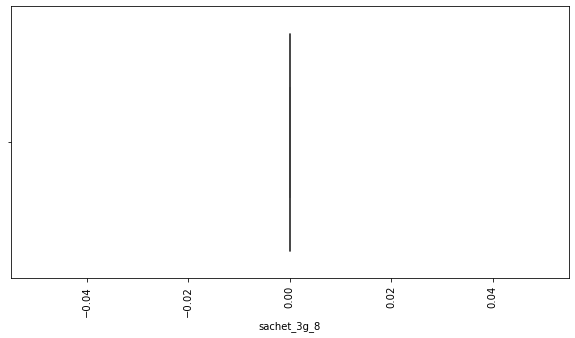

Outliers :  aon -3619.5 6640.5


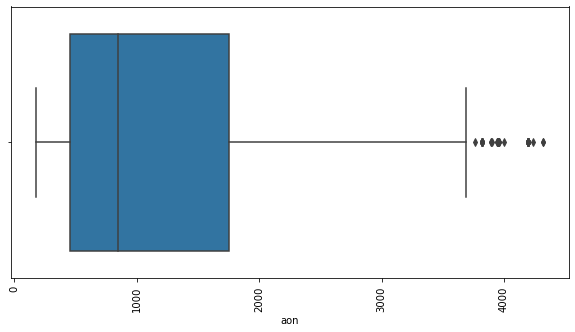

Outliers :  sep_vbc_3g -1.35 2.25


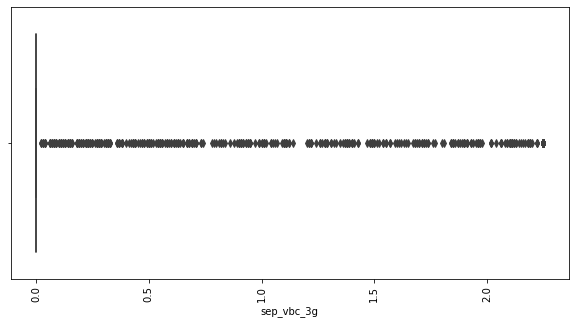

Outliers :  total_rech_6 -2415.5 4668.5


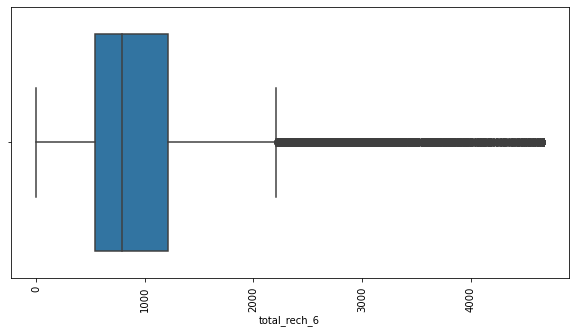

Outliers :  total_rech_7 -2670.0 5090.0


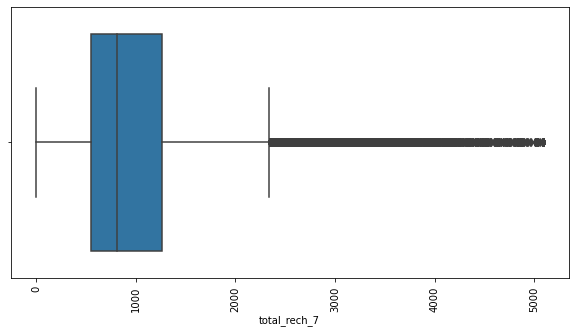

Outliers :  total_rech_8 -3057.0 5095.0


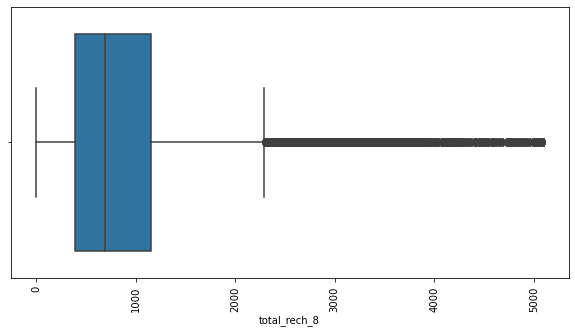

Outliers :  total_rech_6_7 -3474.5 8457.5


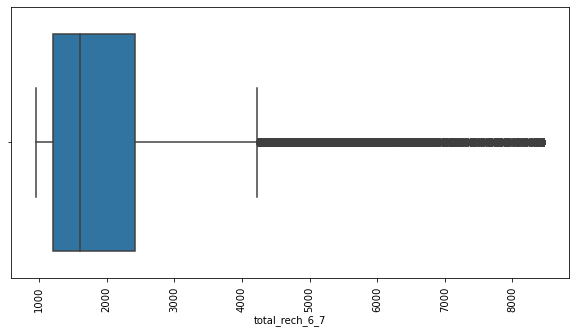

Outliers :  Churn 0.0 0.0


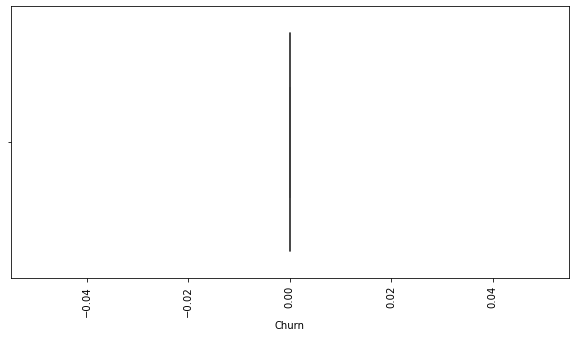

Outliers :  Total_Revenue_6 -6049367.5 11582412.5


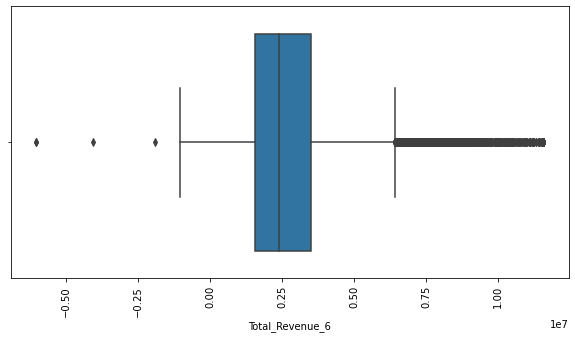

Outliers :  Total_Revenue_7 -6040530.0 11591190.0


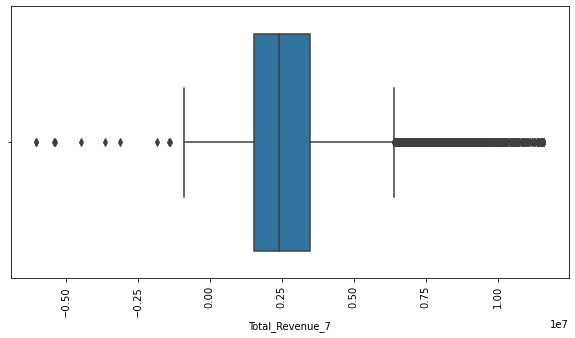

Outliers :  Total_Revenue_8 -7210712.5 12145187.5


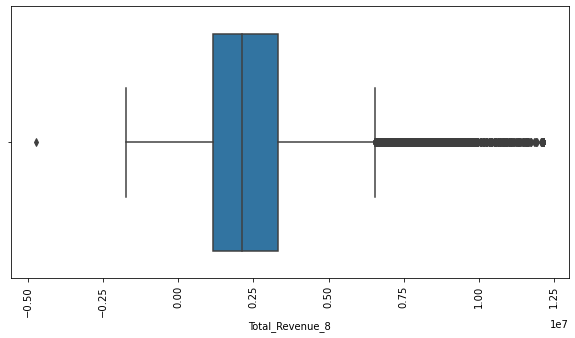

Outliers :  Good_Phase -10386720.0 21424960.0


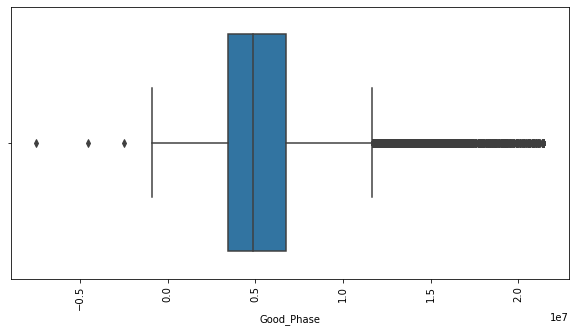

Outliers :  Action_Phase -7210712.5 12145187.5


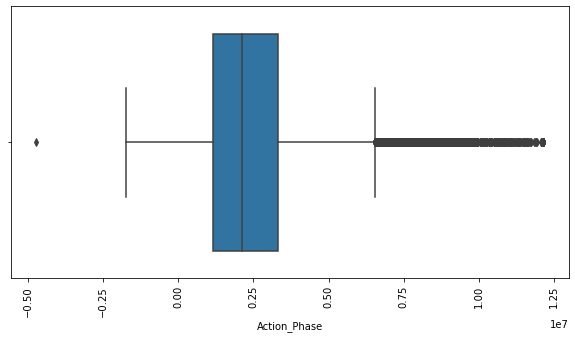

Outliers :  Churn_Phase -7014000.0 11690000.0


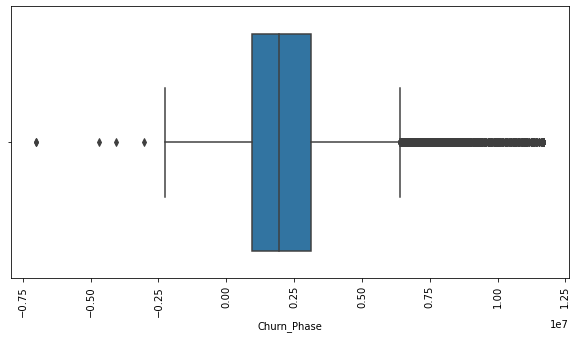

Outliers :  roam_any_6 -1.5 2.5


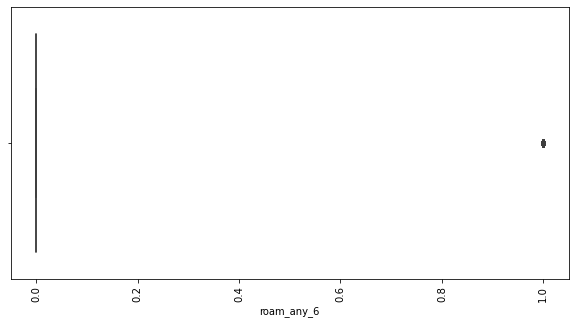

Outliers :  roam_any_7 -1.5 2.5


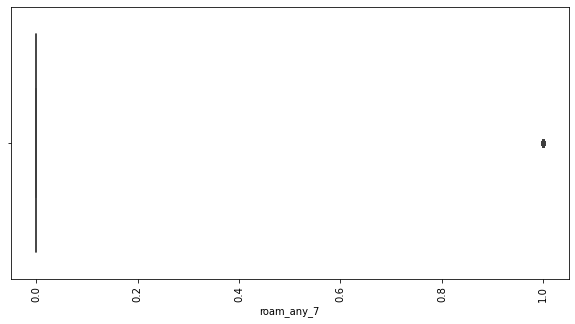

Outliers :  roam_any_8 -1.5 2.5


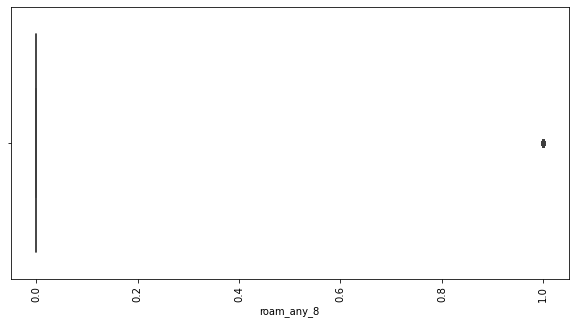

Outliers :  local_any_6 1.0 1.0


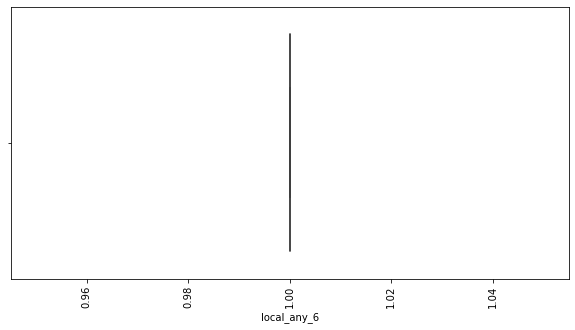

Outliers :  local_any_7 1.0 1.0


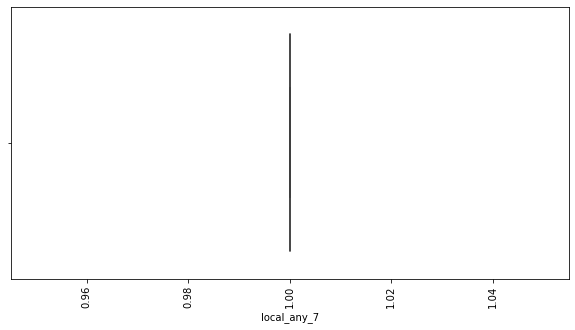

Outliers :  local_any_8 -1.5 2.5


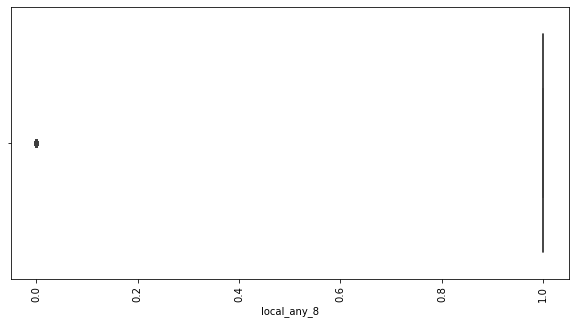

Outliers :  std_any_6 -1.5 2.5


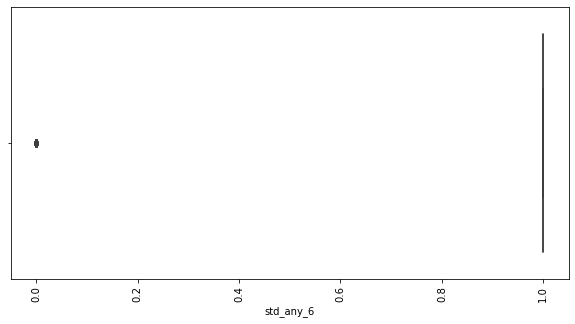

Outliers :  std_any_7 -1.5 2.5


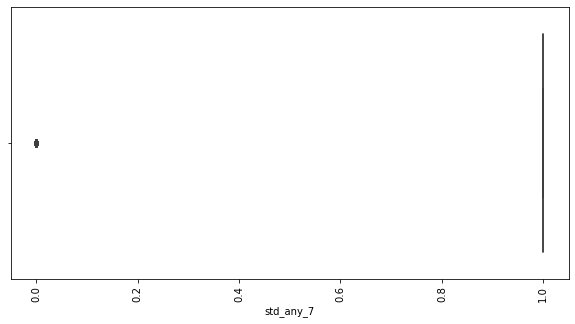

Outliers :  std_any_8 -1.5 2.5


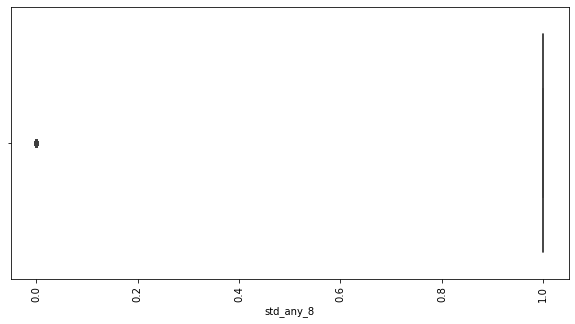

Outliers :  spl_any_6 -1.5 2.5


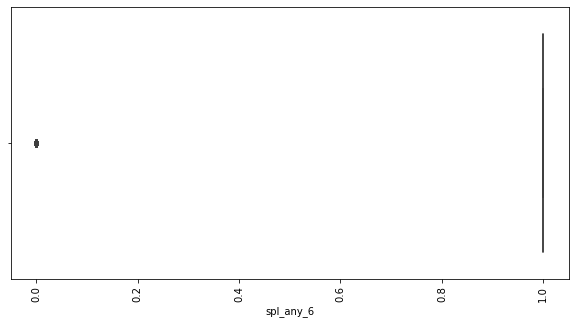

Outliers :  spl_any_7 -1.5 2.5


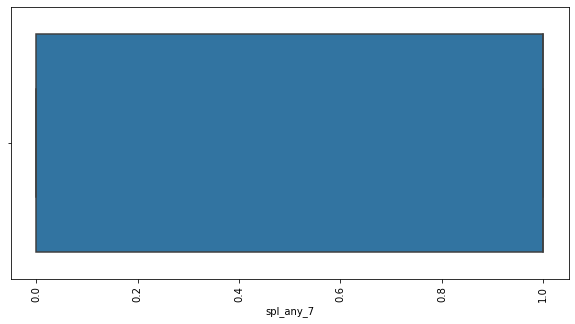

Outliers :  spl_any_8 -1.5 2.5


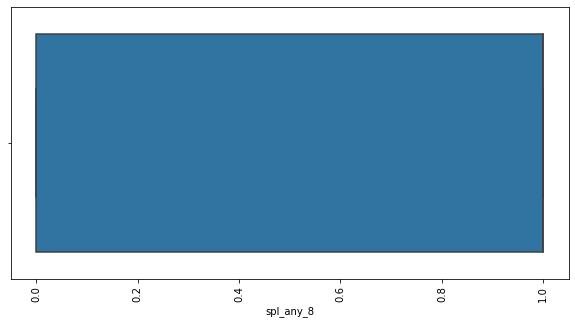

Outliers :  data_used_6 -2718.1200000000003 4530.200000000001


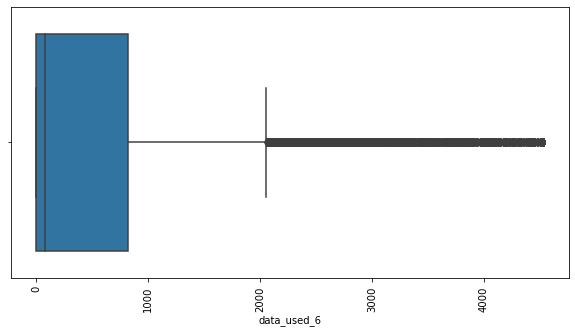

Outliers :  data_used_7 -2890.1549999999997 4816.924999999999


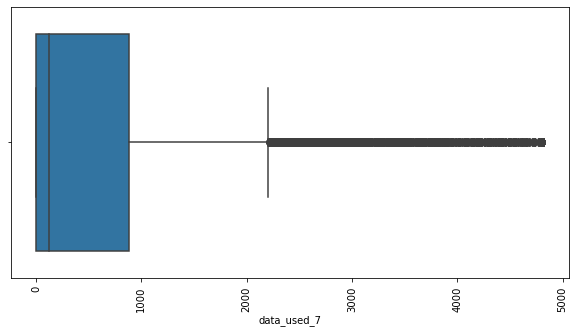

Outliers :  data_used_8 -2760.915 4601.525


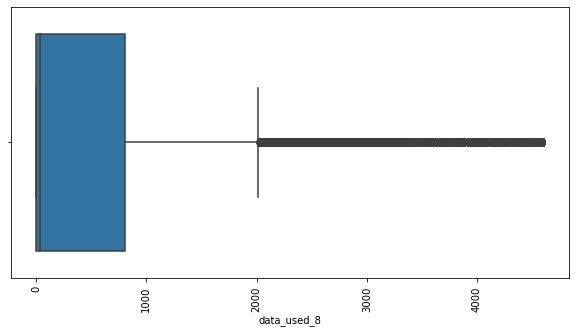

In [71]:
#remove outliers
hvc_outliers_data = hvc[check_outliers]
for i in hvc_outliers_data.columns:
    Q1 = hvc_outliers_data[i].quantile(0.05)
    Q3 = hvc_outliers_data[i].quantile(0.90)
    IQR = Q3 - Q1
    lower_fence = Q1-1.5*IQR
    upper_fence = Q3+1.5*IQR
    hvc_outliers_data[i][hvc_outliers_data[i] <= lower_fence] = lower_fence
    hvc_outliers_data[i][hvc_outliers_data[i] >= upper_fence] = upper_fence
    print("Outliers : ",i,lower_fence,upper_fence)
    plt.figure(1,figsize=(10,5))
    sns.boxplot(hvc_outliers_data[i])
    plt.xticks(rotation=90,fontsize=10)
    plt.show()

- Now we have removed the outliers and we can proceed further for modelling which we defined as we took lower ranges of the quartiles due to avoid loss of data

In [72]:
hvc_outliers_data.shape

(30001, 52)

In [73]:
final_model_data = hvc_outliers_data

In [74]:
#Check the final dataset shape
final_model_data.shape

(30001, 52)

In [75]:
final_model_data.head()

,arpu_6,arpu_7,arpu_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,sep_vbc_3g,total_rech_6,total_rech_7,total_rech_8,total_rech_6_7,Churn,Total_Revenue_6,Total_Revenue_7,Total_Revenue_8,Good_Phase,Action_Phase,Churn_Phase,roam_any_6,roam_any_7,roam_any_8,local_any_6,local_any_7,local_any_8,std_any_6,std_any_7,std_any_8,spl_any_6,spl_any_7,spl_any_8,data_used_6,data_used_7,data_used_8
0,197.385,214.816,213.8030,0.00,0.00,0.00,0.00,0.00,5.44,252,252,252.0,0.0,0.0,0.0,0,0.0,0,1.0,1.0,1.0,0.0,0.0,0,968,2.25,614.0,504.0,504.0,1118.0,0,986925.0,1074080.0,1069015.0,2061005.0,1069015.0,105500.0,0,0,0,1,1,1,0,0,0,0,0,0,214.90,152.08,145.76
7,1069.180,1349.850,2429.0375,487.53,609.24,350.16,626.46,558.04,428.74,0,0,562.5,0.0,0.0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,802,0.00,1580.0,790.0,3638.0,2370.0,0,5345900.0,6749250.0,12145187.5,12095150.0,12145187.5,2500000.0,1,1,1,1,1,1,1,1,1,1,1,1,18.74,19.38,57.74
8,378.721,492.223,137.3620,508.36,431.66,171.56,103.86,28.49,16.54,50,0,10.0,0.0,1.0,0.0,0,1.0,3,0.0,0.0,0.0,0.0,0.0,0,315,0.00,437.0,955.0,327.0,1392.0,0,1893605.0,2461115.0,686810.0,4354720.0,686810.0,833935.0,0,0,0,1,1,1,1,1,1,0,0,1,122.16,2017.60,33.00
21,514.453,597.753,637.7600,860.34,1028.79,1068.54,207.09,131.89,261.04,30,20,50.0,0.0,0.0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0,720,0.00,600.0,680.0,718.0,1280.0,0,2572265.0,2988765.0,3188800.0,5561030.0,3188800.0,2892980.0,0,0,0,1,1,1,1,1,1,0,0,0,0.00,0.00,0.00
23,74.350,193.897,366.9660,134.38,140.04,239.48,119.58,222.89,298.33,0,179,0.0,0.0,0.0,0.0,0,0.0,0,0.0,2.0,1.0,0.0,0.0,0,604,0.00,0.0,1166.0,979.0,1166.0,0,371750.0,969485.0,1834830.0,1341235.0,1834830.0,4057400.0,0,0,0,1,1,1,1,1,1,1,1,1,0.00,651.43,1050.38


### PCA

In [78]:
#let us do the PCA to reduce the dimensionality of the data and proceed with the Logistic regression first and move forward to other models
#Import PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [79]:
#Let us fit the model with PCA
pca.fit(X_train_re)

#List of PCA components, it would be the same as number of variables
pca.components_

array([[ 5.56220257e-04, -3.26620624e-03, -5.76127518e-03, ...,
         7.31738396e-04, -3.11454146e-03, -4.15852088e-03],
       [-5.54639995e-03, -4.48493648e-03, -1.65780648e-03, ...,
         7.68479409e-03,  1.10698726e-02,  7.92879638e-03],
       [-1.89363670e-03,  2.40420580e-03,  7.05802339e-03, ...,
         7.47028219e-04,  4.68679268e-03,  6.17814407e-03],
       ...,
       [-0.00000000e+00, -1.58463056e-01, -7.69206840e-01, ...,
         4.87968231e-16,  1.25854188e-15,  2.29308759e-16],
       [-0.00000000e+00,  8.77022079e-12, -2.36607558e-10, ...,
        -3.70480362e-16,  1.47507034e-16,  1.83043682e-16],
       [-0.00000000e+00,  1.04676603e-02, -9.92737919e-03, ...,
         7.68287085e-16, -6.56335338e-16,  1.23090235e-15]])

In [85]:
#Let's check the variance ratios
pca.explained_variance_ratio_[:50]

array([3.21008451e-01, 1.53990635e-01, 1.25145629e-01, 7.76008894e-02,
       6.79787769e-02, 6.19823693e-02, 4.28717828e-02, 3.34410725e-02,
       2.82773218e-02, 2.55229666e-02, 1.81827266e-02, 1.09447856e-02,
       8.54507228e-03, 5.56299369e-03, 3.42222678e-03, 2.43808834e-03,
       2.19541845e-03, 1.83325354e-03, 1.62144977e-03, 9.50356602e-04,
       8.58957264e-04, 7.50815495e-04, 6.30756765e-04, 5.85425577e-04,
       4.91118749e-04, 3.91222369e-04, 3.46423157e-04, 3.32240997e-04,
       2.94285268e-04, 2.61185252e-04, 2.59967779e-04, 2.29929359e-04,
       2.20049110e-04, 1.63283572e-04, 1.35861553e-04, 1.03525503e-04,
       9.63688753e-05, 8.59006342e-05, 5.98751208e-05, 5.61187260e-05,
       4.48340139e-05, 2.96721240e-05, 2.10540736e-05, 1.80592046e-05,
       1.68048026e-05, 2.04438325e-33, 1.56358407e-33, 1.56358407e-33,
       1.56358407e-33, 1.56358407e-33])

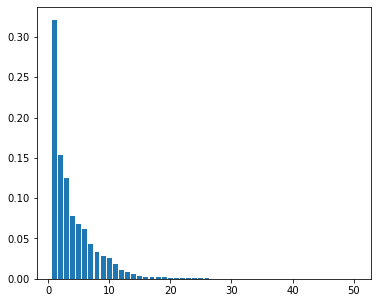

In [87]:
#Visualise the pca variance ration in a bar graph
plt.figure(figsize=(6,5))
plt.bar(range(1,len(pca.explained_variance_ratio_[:50])+1), pca.explained_variance_ratio_[:50])
plt.show()

In [89]:
#Most of the data is in the 0 to 2 range. Let's see the cummulative variance ratio
var_cum = np.cumsum(pca.explained_variance_ratio_)

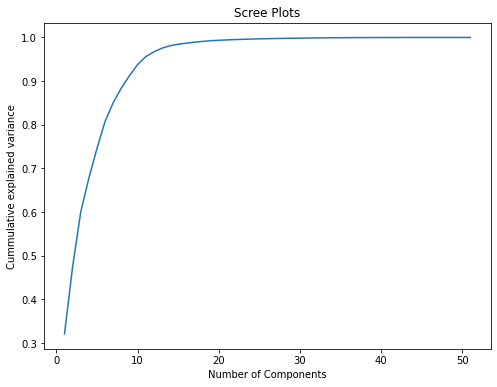

In [90]:
#We can see most of the data is lying between 0 to 10
#Make the scree plots clearly for choosing the number of PCA
plt.figure(figsize=(8,6))
plt.title('Scree Plots')
plt.xlabel('Number of Components')
plt.ylabel('Cummulative explained variance')
plt.plot(range(1,len(var_cum)+1), var_cum)
plt.show()

- We will take 12 components for describe the 95% of the variance in the dataset

In [91]:
#Once again we will apply PCA with components
pca = PCA(n_components=12, random_state=42)

In [92]:
#Let us fit the data
X_train_pca = pca.fit_transform(X_train_re)
X_train_pca.shape

(38618, 12)

In [94]:
#Creating the correlation matrix for the principal components
corr_mat = np.corrcoef(X_train_pca.transpose())
corr_mat_nodiag = corr_mat - np.diagflat(corr_mat.diagonal())
print("Max corr: ", corr_mat_nodiag.max(),", min corr: ",corr_mat_nodiag.min(),)

Max corr:  8.300739921150251e-16 , min corr:  -9.728595415674697e-16


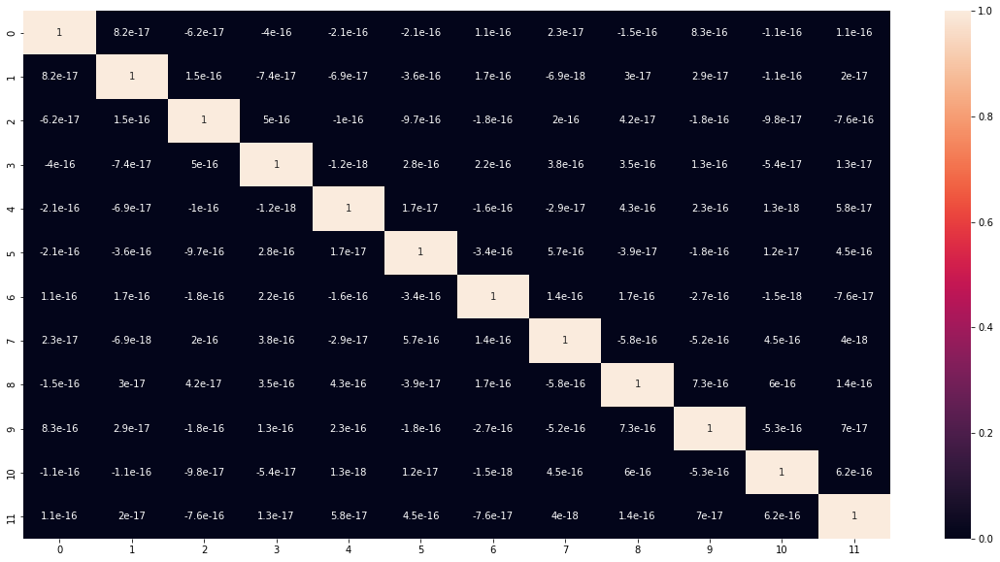

In [97]:
plt.figure(figsize=(20,10))
sns.heatmap(corr_mat, annot=True)
plt.show()

In [98]:
#Applying selected omponents to the test data - 12 components
X_test_pca = pca.transform(X_test)
X_test_pca.shape

(9001, 12)

For the prediction of churn customers, we will be fitting variety of models and select one which is the best predictor of churn. Models trained are
- Logistic Regression
- Decision Tree
- Random Forest
- Boosting models - Gradient Boosting Classifier and XGBoost Classifier
- SVM

### Logistic Regression and PCA

In [101]:
#import libraries
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

lr = LogisticRegression(class_weight='balanced')

In [132]:
#Fit the algorithm on the data
def model_fit(algo, X_train, y_train, performCV=True, cv_folds=5):
    algo.fit(X_train,y_train)
    
    #Predict the training set
    dtrain_predictions = algo.predict(X_train)
    dtrain_predprob = algo.predict_proba(X_train)[:,1]
    
    #Perform cross-validation
    if performCV:
        cv_score = cross_val_score(algo, X_train, y_train, cv=cv_folds, scoring='roc_auc')
    
    #Print the model report
    print("Model Summary :")
    print("Accuracy :{:2.2}".format(metrics.accuracy_score(y_train, dtrain_predictions)))
    print("Sensitivity/Recall : {:2.2}".format(metrics.recall_score(y_train, dtrain_predictions)))
    print("AUC Score : {:2.2}".format(metrics.roc_auc_score(y_train, dtrain_predprob)))
    
    if performCV:
        print("CV Score: Mean - %.7g | Std - %.7g | Min - %.7g | Max - %.7g" %(np.mean(cv_score), np.std(cv_score), np.min(cv_score), np.max(cv_score)))

In [133]:
#Let us fit the model
model_fit(lr, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.8
Sensitivity/Recall : 0.74
AUC Score : 0.87
CV Score: Mean - 0.8694483 | Std - 0.005250362 | Min - 0.8608194 | Max - 0.8773552


In [128]:
#Define the model metrics
def model_metrics(actual_churn=False, predict_churn=False):
    confusion = metrics.confusion_matrix(actual_churn, predict_churn)
    TP = confusion[1,1] #True Positive
    TN = confusion[0,0] #
    FP = confusion[0,1] #False Positive
    FN = confusion[1,0] #False Negative
    print("Roc_auc_score : {:2.2}".format(metrics.roc_auc_score(actual_churn, predict_churn)))
    print("Sensitivity/Recall : {:2.2}".format(TP/float(TP+FN)))
    print("Specificity : {:2.2}".format(TN/float(TN+FP)))
    print("False Positive Rate : {:2.2}".format(FP/float(TN+FP)))
    print("Positive Predictive value : {:2.2}".format(TP/float(TP+FP)))
    print("Negative Predictive value : {:2.2}".format(TN/float(TN+FN)))
    print("sklearn precision score value : {:2.2}".format(metrics.precision_score(actual_churn, predict_churn)))

In [129]:
#Prediction on test data
pred_prob_test = lr.predict(X_test_pca)
model_metrics(y_test, pred_prob_test)

Roc_auc_score : 0.81
Sensitivity/Recall : 0.74
Specificity : 0.87
False Positive Rate : 0.13
Positive Predictive value : 0.35
Negative Predictive value : 0.97
sklearn precision score value : 0.35


In [127]:
#Check the accuracy, recall and precision again
print("Accuracy : {:2.2}".format(metrics.accuracy_score(y_test,pred_prob_test)))
print("Recall : {:2.2}".format(metrics.recall_score(y_test,pred_prob_test)))
print("Precision : {:2.2}".format(metrics.precision_score(y_test,pred_prob_test)))

Accuracy : 0.86
Recall : 0.74
Precision : 0.35


In [125]:
#Making prediction
pred_prob_train = lr.predict_proba(X_train_pca)[:,1]
print("roc_auc_score(Train) {:2.2}".format(metrics.roc_auc_score(y_train_re, pred_prob_train)))

roc_auc_score(Train) 0.87


In [164]:
#Let us find the cutoff values
#Function to find the optimal utoff for classifying as churn/non-churn
#Let's create columns with different probability cutoffs
def optimal_cutoff(df):
    #Let's create columns with different probability cutoffs
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        df[i] = df.Churn_Prob.map(lambda x:1 if x>i else 0)
    
    cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensitivity', 'specificity'])
    
    #import required module
    from sklearn.metrics import confusion_matrix
    num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    for i in num:
        cm1 = metrics.confusion_matrix(df.Churn, df[i])
        total1 = sum(sum(cm1))
        accuracy = (cm1[0,0]+cm1[1,1])/total1
        specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
        sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
        cutoff_df.loc[i] = [i, accuracy, sensitivity, specificity]
    print(cutoff_df)
    
    #Lets plot the accuracy, sensitivity and specificity for various probabilities
    cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])
    plt.show()

In [135]:
#Function to predict the churn using the input cut-off
def predictChurnWithProb(model,X,y,prob):
    pred_prob = model.predict_proba(X)[:,1]
    y_df = pd.DataFrame({'Churn':y,'Churn_Prob':pred_prob})
    y_df['Final_Predicted'] = y_df.Churn_Prob.map(lambda x:1 if x>prob else 0)
    model_metrics(y_df.Churn, y_df.Final_Predicted)
    return y_df

In [150]:
cutoff_prob=0.5
y_train_df = predictChurnWithProb(lr, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.74
Specificity : 0.87
False Positive Rate : 0.13
Positive Predictive value : 0.85
Negative Predictive value : 0.77
sklearn precision score value : 0.85


#### Lets draw the ROC Curve
It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompained by a decrease in specificity).
The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
The closer the curve comes to the 45 degree diagonal of the ROC space, the less accurate the test.

In [159]:
#Lets define the roc curve
def draw_roc(actual, probs):
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate=False)
    auc_score = metrics.roc_auc_score(actual, probs)
    plt.figure(figsize=(6,6))
    plt.plot(fpr, tpr, label='ROC Curve (area= %0.2f)' %auc_score)
    plt.plot([0,1], [0,1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

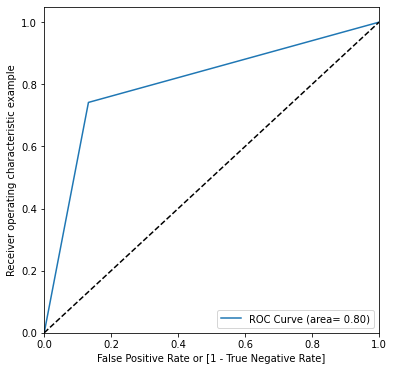

(array([0.        , 0.13216635, 1.        ]),
 array([0.        , 0.74167487, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [160]:
#Check th ROC Curve
draw_roc(y_train_df.Churn, y_train_df.Final_Predicted)

- ROC Curve (area=0.80) shows good fit

In [161]:
#Draw ROC Curve
print("roc_auc_score : {:2.2f}".format(metrics.roc_auc_score(y_train_df.Churn, y_train_df.Final_Predicted)))

roc_auc_score : 0.80


##### Finding Optimal CutOff Point :
    A trade off between sensitivity (or recall) and specificity is to be considered in doing so, we need to tune the probability to get a better tradeoff for sensitivity and specificity

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.548009     0.992128     0.103889
0.2   0.2  0.654203     0.946812     0.361593
0.3   0.3  0.775234     0.844787     0.705681
0.4   0.4  0.801621     0.787094     0.816148
0.5   0.5  0.804754     0.741675     0.867834
0.6   0.6  0.805428     0.695013     0.915842
0.7   0.7  0.769615     0.584650     0.954581
0.8   0.8  0.746310     0.524212     0.968409
0.9   0.9  0.717696     0.462064     0.973328


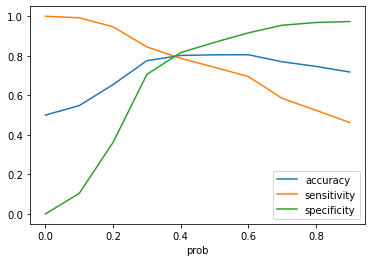

In [165]:
#Finding cutoff with the right balance of the metrices
optimal_cutoff(y_train_df)

- Note that the cut off is between the 0.2 and 0.4. We choose to take the 0.38. At this point, there will be balance of accuracy, sensitivity and specificity

In [169]:
cutoff_prob = 0.38
A = predictChurnWithProb(lr,X_train_pca,y_train_re,cutoff_prob)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.8
Specificity : 0.8
False Positive Rate : 0.2
Positive Predictive value : 0.8
Negative Predictive value : 0.8
sklearn precision score value : 0.8


In [170]:
#Let us predict on test set with the choosen cutoff
B = predictChurnWithProb(lr, X_test_pca, y_test, cutoff_prob)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.79
Specificity : 0.81
False Positive Rate : 0.19
Positive Predictive value : 0.27
Negative Predictive value : 0.98
sklearn precision score value : 0.27


### Conclusion on Logistic Regression and PCA
#### Train Set:
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.80
- Specificity : 0.80
    
#### Test Set:
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.79
- Specificity : 0.81

### Decision Tree

In [171]:
#Let us apply the Decision tree with PCA and hyper parameters and fit
dTree = DecisionTreeClassifier(class_weight='balanced', max_features='auto', min_samples_split=100, min_samples_leaf=100, max_depth=6, random_state=10)
model_fit(dTree, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.82
Sensitivity/Recall : 0.75
AUC Score : 0.88
CV Score: Mean - 0.8740973 | Std - 0.002909164 | Min - 0.8716329 | Max - 0.8789812


In [173]:
#Make predictions
pred_prob_test = dTree.predict(X_test_pca)

#Lets check the model metrics
model_metrics(actual_churn=y_test, predict_churn=pred_prob_test)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.7
Specificity : 0.89
False Positive Rate : 0.11
Positive Predictive value : 0.36
Negative Predictive value : 0.97
sklearn precision score value : 0.36


In [214]:
#Create the parameter grid based on the results of random search
param_grid = {'max_depth': range(5,15,3),'min_samples_leaf': range(100,400,50),'min_samples_split': range(100,400,100),'max_features': [8,10,15]}
dTree = DecisionTreeClassifier(class_weight='balanced', random_state=10)
grid_search = GridSearchCV(estimator = dTree, param_grid = param_grid, cv=3, n_jobs=4, verbose=1, scoring="accuracy", return_train_score=True)

In [215]:
#Fit the grid search to the data
grid_search.fit(X_train_pca, y_train_re)

Fitting 3 folds for each of 216 candidates, totalling 648 fits


GridSearchCV(cv=3,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=10),
             n_jobs=4,
             param_grid={'max_depth': range(5, 15, 3),
                         'max_features': [8, 10, 15],
                         'min_samples_leaf': range(100, 400, 50),
                         'min_samples_split': range(100, 400, 100)},
             return_train_score=True, scoring='accuracy', verbose=1)

In [229]:
#Print the optimal accuracy score and hyper parameters
print("Recall score", grid_search.best_score_)
print("Best Parameters", grid_search.best_estimator_)

Recall score 0.824382429545374
Best Parameters DecisionTreeClassifier(class_weight='balanced', max_depth=14, max_features=15,
                       min_samples_leaf=100, min_samples_split=100,
                       random_state=10)


In [197]:
#Model with the best hyperparameters
dTree_final = DecisionTreeClassifier(class_weight='balanced', max_depth=14, min_samples_leaf=100, min_samples_split=100, max_features=15, random_state=10)

In [198]:
#Fit the model and get the model summary
model_fit(dTree_final, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.84
Sensitivity/Recall : 0.81
AUC Score : 0.92
CV Score: Mean - 0.9055846 | Std - 0.003147496 | Min - 0.9025774 | Max - 0.9112391


In [199]:
#Make the prediction in the test data 
pred_prob_test = dTree_final.predict(X_test_pca)

#Lets check the model metrices
model_metrics(actual_churn=y_test, predict_churn=pred_prob_test)

Roc_auc_score : 0.79
Sensitivity/Recall : 0.73
Specificity : 0.85
False Positive Rate : 0.15
Positive Predictive value : 0.31
Negative Predictive value : 0.97
sklearn precision score value : 0.31


In [200]:
#Classification report
print(classification_report(y_test,pred_prob_test))

              precision    recall  f1-score   support

           0       0.97      0.85      0.91      8251
           1       0.31      0.73      0.44       750

    accuracy                           0.84      9001
   macro avg       0.64      0.79      0.67      9001
weighted avg       0.92      0.84      0.87      9001



In [201]:
#After tuning also we can see 73% of churn
#Predicting the churn with default cutoff 0.5
cutoff_prob = 0.5
y_train_df = predictChurnWithProb(dTree_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.84
Sensitivity/Recall : 0.81
Specificity : 0.86
False Positive Rate : 0.14
Positive Predictive value : 0.86
Negative Predictive value : 0.82
sklearn precision score value : 0.86


     prob  accuracy  sensitivity  specificity
0.0   0.0  0.582138     1.000000     0.164276
0.1   0.1  0.686105     0.991765     0.380444
0.2   0.2  0.715573     0.978456     0.452690
0.3   0.3  0.814387     0.899736     0.729038
0.4   0.4  0.833756     0.851831     0.815682
0.5   0.5  0.837744     0.811435     0.864053
0.6   0.6  0.831659     0.744679     0.918639
0.7   0.7  0.823347     0.707701     0.938992
0.8   0.8  0.798876     0.636025     0.961728
0.9   0.9  0.742348     0.497540     0.987156


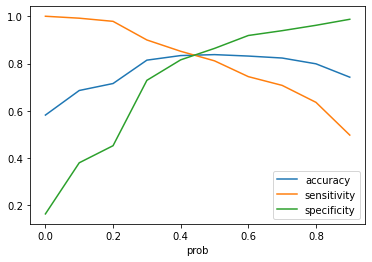

In [202]:
#Finding the cutoff with the right balance of the metrics
optimal_cutoff(y_train_df)

- We can see that cutoff value is between 0.4 to 0.6. Let us check a gain cutoff as 0.45 and run again

In [203]:
cutoff_prob = 0.45
y_train_df = predictChurnWithProb(dTree_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.84
Sensitivity/Recall : 0.84
Specificity : 0.84
False Positive Rate : 0.16
Positive Predictive value : 0.84
Negative Predictive value : 0.84
sklearn precision score value : 0.84


In [204]:
#Lets see how it performs on test data.
y_test_df = predictChurnWithProb(dTree_final, X_test_pca, y_test, cutoff_prob)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.77
Specificity : 0.83
False Positive Rate : 0.17
Positive Predictive value : 0.29
Negative Predictive value : 0.97
sklearn precision score value : 0.29


### Conclusion on Decision Tree 
#### Train Set
- Roc_auc_score : 0.84
- Sensitivity/Recall : 0.84
- Specificity : 0.84

#### Test Set
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.77
- Specificity : 0.83

### Random Forest

In [218]:
#Let us apply the random forest
parameters = {'max_depth': range(10,30,5)}
rfc = RandomForestClassifier()
rfgs = GridSearchCV(rfc, parameters, n_jobs=-1, cv=5, scoring="accuracy", return_train_score=True)
rfgs.fit(X_train_pca,y_train_re)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(10, 30, 5)},
             return_train_score=True, scoring='accuracy')

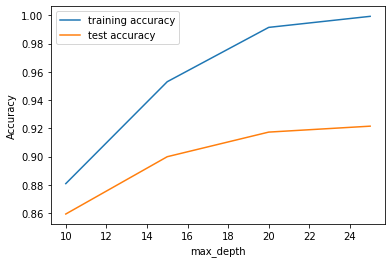

In [219]:
scores = rfgs.cv_results_
#Plotting accuracies with max_depth
plt.plot(scores["param_max_depth"], scores["mean_train_score"], label = "training accuracy")
plt.plot(scores["param_max_depth"], scores["mean_test_score"], label = "test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

- We can see that the max_depth after 15, there were no significant changes observed

In [261]:
#Lets tune with the n_estimators
params = {'n_estimators': range(50,150,25)}
rf1 = RandomForestClassifier(max_depth=15, n_jobs=-1, random_state=100)
rfgs = GridSearchCV(rf1, params, cv=5, scoring ="accuracy", return_train_score=True)

In [262]:
#Again fit the parameters
rfgs.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(max_depth=15, n_jobs=-1,
                                              random_state=100),
             param_grid={'n_estimators': range(50, 150, 25)},
             return_train_score=True, scoring='accuracy')

In [263]:
#Plotting the accuracies
def plt_traintest_accuracy(score, param):
    scores=score
    plt.figure()
    plt.plot(scores["param_"+param], scores["mean_train_score"], label = "training accuracy")
    plt.plot(scores["param_"+param], scores["mean_test_score"], label = "test accuracy")
    plt.xlabel(param)
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

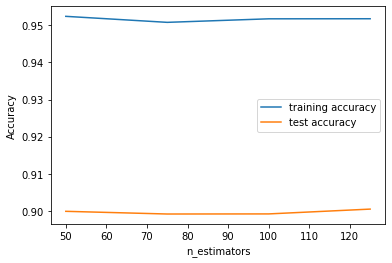

In [264]:
plt_traintest_accuracy(rfgs.cv_results_, 'n_estimators')

- We can see between 70 to 80, let us take 80 as our n_estimators

In [265]:
#Max features tuning with 80
params = {'max_features':[4,8,14,20,24]}
rf3 = RandomForestClassifier(max_depth=15, n_estimators=80, n_jobs=-1, random_state=100)
rfgs = GridSearchCV(rf3, params, cv=5, scoring="accuracy", return_train_score=True)

In [266]:
#Lets fit again and check
rfgs.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(max_depth=15, n_estimators=80,
                                              n_jobs=-1, random_state=100),
             param_grid={'max_features': [4, 8, 14, 20, 24]},
             return_train_score=True, scoring='accuracy')

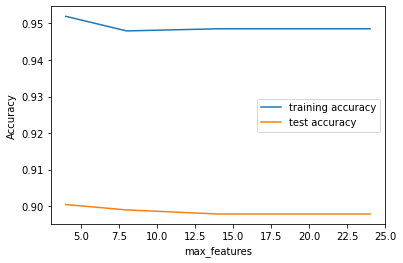

In [267]:
#Check the accuracy of max_features
plt_traintest_accuracy(rfgs.cv_results_, 'max_features')

In [268]:
#As we see that at 7.5 and later it is declining but we will max features as 8
#Let us tune the min_sample_leaf
params = {'min_samples_leaf': range(100,400,50)}
rf4 = RandomForestClassifier(max_depth=15, n_estimators=80, max_features=8, n_jobs=-1, random_state=100)
rfgs = GridSearchCV(rf4, params, cv=5, scoring="accuracy", return_train_score=True)

In [269]:
#Let us fit again and plt the curve
rfgs.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(max_depth=15, max_features=8,
                                              n_estimators=80, n_jobs=-1,
                                              random_state=100),
             param_grid={'min_samples_leaf': range(100, 400, 50)},
             return_train_score=True, scoring='accuracy')

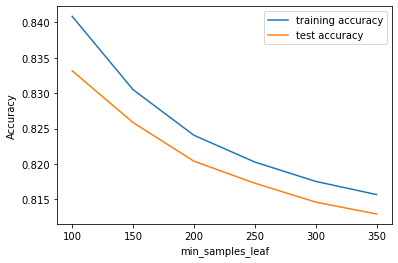

In [270]:
plt_traintest_accuracy(rfgs.cv_results_, 'min_samples_leaf')

In [271]:
#As we see that min samples leaf is 100. Let us tune min samples leaf
params = {'min_samples_split': range(50,300,50)}
rf5 = RandomForestClassifier(max_depth=15, n_estimators=80, max_features=8, n_jobs=-1, min_samples_leaf=200, random_state=100)
rfgs = GridSearchCV(rf4, params, cv=5, scoring="accuracy", return_train_score=True)

In [272]:
#Let us fit again and plt the curve
rfgs.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(max_depth=15, max_features=8,
                                              n_estimators=80, n_jobs=-1,
                                              random_state=100),
             param_grid={'min_samples_split': range(50, 300, 50)},
             return_train_score=True, scoring='accuracy')

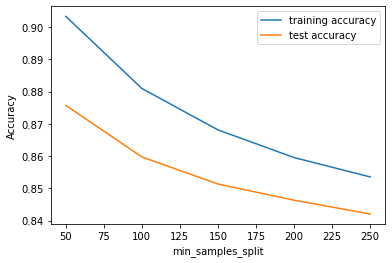

In [273]:
plt_traintest_accuracy(rfgs.cv_results_, 'min_samples_split')

In [274]:
#The min samples split is 50 later its almost flat and it is declining at 200
#Final - Tuned in all aspects.
rf_final = RandomForestClassifier(max_depth=15, n_estimators=80, n_jobs=-1, max_features=8, min_samples_leaf=100, min_samples_split=100, random_state=100)

In [275]:
#check the train set
model_fit(rf_final, X_train_pca,y_train_re)

Model Summary :
Accuracy :0.84
Sensitivity/Recall : 0.79
AUC Score : 0.93
CV Score: Mean - 0.9166243 | Std - 0.003004408 | Min - 0.9123769 | Max - 0.9212001


In [276]:
#Predict on test data
pred = rf_final.predict(X_test_pca)

In [277]:
#Check the model metrics in test
model_metrics(y_test,pred)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.72
Specificity : 0.89
False Positive Rate : 0.11
Positive Predictive value : 0.38
Negative Predictive value : 0.97
sklearn precision score value : 0.38


- After fine tuning, we can see that recall for final random forest is only 72%

In [278]:
#let us check the cutoff optimal value as we did for the other models
#Predicting churn with default cutoff 0.5
cutoff_prob=0.5
y_train_df = predictChurnWithProb(rf_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.84
Sensitivity/Recall : 0.79
Specificity : 0.89
False Positive Rate : 0.11
Positive Predictive value : 0.88
Negative Predictive value : 0.81
sklearn precision score value : 0.88


     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.629706     0.998084     0.261329
0.2   0.2  0.755710     0.978922     0.532498
0.3   0.3  0.829043     0.924750     0.733337
0.4   0.4  0.847273     0.858563     0.835983
0.5   0.5  0.843286     0.794137     0.892434
0.6   0.6  0.830545     0.734217     0.926873
0.7   0.7  0.812652     0.671138     0.954166
0.8   0.8  0.785074     0.598477     0.971671
0.9   0.9  0.737584     0.486664     0.988503


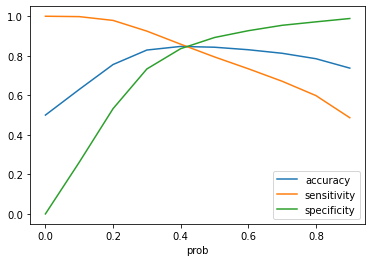

In [279]:
#Let us see the cut off with the metrics of accuracy, sensitivity and specificity
optimal_cutoff(y_train_df)

- We can see that the optimal value is lying in 0.4 to 0.6. Let us take 0.42 as cutoff


In [281]:
cutoff_prob=0.42
A = predictChurnWithProb(rf_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.85
Sensitivity/Recall : 0.84
Specificity : 0.85
False Positive Rate : 0.15
Positive Predictive value : 0.85
Negative Predictive value : 0.84
sklearn precision score value : 0.85


In [282]:
#Make the prediction on the test
y_test_df = predictChurnWithProb(rf_final, X_test_pca, y_test, cutoff_prob)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.76
Specificity : 0.85
False Positive Rate : 0.15
Positive Predictive value : 0.32
Negative Predictive value : 0.97
sklearn precision score value : 0.32


### Conclusion on Random Forest
#### Train Set
- Roc_auc_score : 0.85
- Sensitivity/Recall : 0.84
- Specificity : 0.85

#### Test Set
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.76
- Specificity : 0.85

### Boosting Models - Gradient Boosting Classifier

In [284]:
#Gradient Boosting Classifier with PCA and hypertuning
#Import the required libraries
from sklearn.ensemble import GradientBoostingClassifier

#Fitting the default Gradient Booting Classifier
Gb = GradientBoostingClassifier(random_state=100)
model_fit(Gb, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.83
Sensitivity/Recall : 0.77
AUC Score : 0.91
CV Score: Mean - 0.9004437 | Std - 0.004019148 | Min - 0.894539 | Max - 0.9060561


In [287]:
#Lets tune the n_estimators
param_t1 = {'n_estimators': range(20,150,10)}
gsearch1 = GridSearchCV(estimator= GradientBoostingClassifier(learning_rate=0.1, min_samples_split=500, min_samples_leaf=50, max_depth=8, max_features='sqrt', subsample=0.8, random_state=100), param_grid = param_t1, scoring="accuracy", n_jobs=4, cv=5)
gsearch1.fit(X_train_pca, y_train_re)                   

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=8,
                                                  max_features='sqrt',
                                                  min_samples_leaf=50,
                                                  min_samples_split=500,
                                                  random_state=100,
                                                  subsample=0.8),
             n_jobs=4, param_grid={'n_estimators': range(20, 150, 10)},
             scoring='accuracy')

In [289]:
#Check the score and n_estimators
print("The best n_estimators: {}".format(gsearch1.best_params_))
print("The best score: {}".format(gsearch1.best_score_))

The best n_estimators: {'n_estimators': 140}
The best score: 0.8593920062162743


In [292]:
#Let us use the n_estimators as 140 and tune the hyperparameters of max depth min samples split and learning rate is taken as 0.1
param_t2 = {'max_depth': range(5,16,2), 'min_samples_split': range(200,1001,200)}
gsearch2 = GridSearchCV(estimator= GradientBoostingClassifier(learning_rate=0.1, n_estimators=140, min_samples_leaf=50, max_features='sqrt', subsample=0.8, random_state=100), param_grid = param_t2, scoring="accuracy", n_jobs=4, cv=5)
gsearch2.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_features='sqrt',
                                                  min_samples_leaf=50,
                                                  n_estimators=140,
                                                  random_state=100,
                                                  subsample=0.8),
             n_jobs=4,
             param_grid={'max_depth': range(5, 16, 2),
                         'min_samples_split': range(200, 1001, 200)},
             scoring='accuracy')

In [293]:
#Check the score and n_estimators
print("The best max_depth and min_samples_split are: {}".format(gsearch2.best_params_))
print("The best score: {}".format(gsearch2.best_score_))

The best max_depth and min_samples_split are: {'max_depth': 15, 'min_samples_split': 200}
The best score: 0.895100828378354


In [294]:
#Let us tune the hyperparameters for min_samples_leaf
param_t3 = {'min_samples_leaf': range(30,71,10)}
gsearch3 = GridSearchCV(estimator= GradientBoostingClassifier(learning_rate=0.1, n_estimators=140, min_samples_split=200, max_depth=15, max_features='sqrt', subsample=0.8, random_state=100), param_grid = param_t3, scoring="accuracy", n_jobs=4, cv=5)
gsearch3.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=15,
                                                  max_features='sqrt',
                                                  min_samples_split=200,
                                                  n_estimators=140,
                                                  random_state=100,
                                                  subsample=0.8),
             n_jobs=4, param_grid={'min_samples_leaf': range(30, 71, 10)},
             scoring='accuracy')

In [295]:
#Check the score and n_estimators
print("The best min_samples_leaf: {}".format(gsearch3.best_params_))
print("The best score: {}".format(gsearch3.best_score_))

The best min_samples_leaf: {'min_samples_leaf': 30}
The best score: 0.8970429044559645


In [296]:
#Check again the max_features hyperparameter tuning and do the grid search
param_t4 = {'max_features': range(7,20,2)}
gsearch4 = GridSearchCV(estimator= GradientBoostingClassifier(learning_rate=0.1, n_estimators=140, min_samples_split=200, max_depth=15, min_samples_leaf=30, subsample=0.8, random_state=100), param_grid = param_t4, scoring="accuracy", n_jobs=4, cv=5)
gsearch4.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=15,
                                                  min_samples_leaf=30,
                                                  min_samples_split=200,
                                                  n_estimators=140,
                                                  random_state=100,
                                                  subsample=0.8),
             n_jobs=4, param_grid={'max_features': range(7, 20, 2)},
             scoring='accuracy')

In [298]:
#Check the score and n_estimators
print("The best max_features: {}".format(gsearch4.best_params_))
print("The best score: {}".format(gsearch4.best_score_))

The best max_features: {'max_features': 7}
The best score: 0.8982081004817706


In [302]:
#Final model for Gradient Boosting with max features
Gb_final = GradientBoostingClassifier(learning_rate=0.1, n_estimators=140, max_features=7, min_samples_split=200, max_depth=15, min_samples_leaf=30, subsample=0.8, random_state=100)
model_fit(Gb_final, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.95
Sensitivity/Recall : 0.95
AUC Score : 0.99
CV Score: Mean - 0.9599905 | Std - 0.003021717 | Min - 0.9545172 | Max - 0.9637284


In [303]:
#Predict on test data
test_pred = Gb_final.predict(X_test_pca)
model_metrics(y_test, test_pred)

Roc_auc_score : 0.78
Sensitivity/Recall : 0.66
Specificity : 0.91
False Positive Rate : 0.089
Positive Predictive value : 0.4
Negative Predictive value : 0.97
sklearn precision score value : 0.4


In [304]:
#Lets predict the churn for default cutoff
cutoff_prob=0.5
y_train_df = predictChurnWithProb(Gb_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.95
Sensitivity/Recall : 0.95
Specificity : 0.94
False Positive Rate : 0.055
Positive Predictive value : 0.94
Negative Predictive value : 0.95
sklearn precision score value : 0.94


     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.818478     0.999379     0.637578
0.2   0.2  0.901730     0.994355     0.809105
0.3   0.3  0.933373     0.985499     0.881247
0.4   0.4  0.946139     0.970894     0.921384
0.5   0.5  0.945880     0.946916     0.944844
0.6   0.6  0.939510     0.915894     0.963126
0.7   0.7  0.920115     0.864364     0.975866
0.8   0.8  0.882904     0.781449     0.984360
0.9   0.9  0.813584     0.633124     0.994044


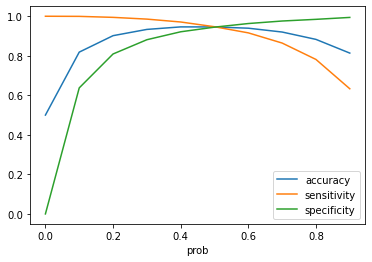

In [305]:
#Lets see the optimal cutoff
optimal_cutoff(y_train_df)

- We can see that the optimal cutoff points between 0.4 to 0.6. Lets take 0.5 and proceed

In [306]:
cutoff_prob = 0.5
A = predictChurnWithProb(Gb_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.95
Sensitivity/Recall : 0.95
Specificity : 0.94
False Positive Rate : 0.055
Positive Predictive value : 0.94
Negative Predictive value : 0.95
sklearn precision score value : 0.94


In [307]:
#Let us predict on test 
y_test_df = predictChurnWithProb(Gb_final, X_test_pca, y_test, cutoff_prob)

Roc_auc_score : 0.78
Sensitivity/Recall : 0.66
Specificity : 0.91
False Positive Rate : 0.089
Positive Predictive value : 0.4
Negative Predictive value : 0.97
sklearn precision score value : 0.4


### Conclusion on Gradient Boosting 
Model in the training data is completely over fitting as we see roc_auc_score and sensitivity is nearly 1
#### Train Set
- Roc_auc_score : 0.95
- Sensitivity/Recall : 0.95
- Specificity : 0.94
    
#### Test Set
- Roc_auc_score : 0.78
- Sensitivity/Recall : 0.66
- Specificity : 0.91

### XGBoosting

In [310]:
#import the required libraries
import xgboost as xgb
from xgboost.sklearn import XGBClassifier

#Fit the XGBClassifier
XGb = XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=5, min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8, objective='binary:logistic', nthread=4, scale_pos_weight=1, seed=27)

In [311]:
#Model fit and performance on train data
model_fit(XGb, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.87
Sensitivity/Recall : 0.82
AUC Score : 0.95
CV Score: Mean - 0.9326378 | Std - 0.003985059 | Min - 0.9259768 | Max - 0.9367076


In [314]:
#Lets tune the hyperparameters
param_t1 = {'max_depth': range(3,10,2), 'min_child_weight': range(1,6,2)}
gsearch1 = GridSearchCV(estimator=XGBClassifier(learning_rate=0.1, n_estimators=140, gamma=0, subsample=0.8, objective='binary:logistic', nthread=4, scale_pos_weight=1, seed=27), param_grid = param_t1, scoring="accuracy", n_jobs=4,cv=5)
gsearch1.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=0, gpu_id=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=140, n_jobs=None, nthread=4,
                                     num_parallel_tree=None, predictor=None, ...),
             n_jobs=4,
             param_grid={'max_depth': range(3, 10, 2),
                         'min_child_weight': range(1, 6, 2)},
             scoring='accuracy')

In [318]:
#Check again the score and hyper tune the parameters
print("The best max_depth and min_child_weight: {}".format(gsearch1.best_params_))
print("The best score: {}".format(gsearch1.best_score_))

The best max_depth and min_child_weight: {'max_depth': 9, 'min_child_weight': 1}
The best score: 0.9002538537728506


In [321]:
#Lets tune the hyperparameters
param_t2 = {'gamma': [i/10.0 for i in range(0,5)]}
gsearch2 = GridSearchCV(estimator=XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=9, min_child_weight=1, subsample=0.8, objective='binary:logistic', nthread=4, scale_pos_weight=1, seed=27), param_grid = param_t2, scoring="accuracy", n_jobs=4,cv=5)
gsearch2.fit(X_train_pca, y_train_re)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=9,
                                     max_leaves=None, min_child_weight=1,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=140, n_jobs=None, nthread=4,
                                     num_parallel_tree=None, predictor=None, ...),
             n_jobs=4, param_grid={'gamma': [0.0, 0.1, 0.2, 0.3, 0.4]},
             scoring='accuracy')

In [324]:
#Check again the score and hyper tune the parameters
print("The best gamma: {}".format(gsearch2.best_params_))
print("The best score: {}".format(gsearch2.best_score_))

The best gamma: {'gamma': 0.4}
The best score: 0.9007976604214024


In [326]:
#Final XGBoosting with gamma 0.4 and fit the model
XGb_final = XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=9, min_child_weight=1, gamma=0.4, subsample=0.8, objective='binary:logistic', nthread=4, scale_pos_weight=1, seed=27)
model_fit(XGb_final, X_train_pca, y_train_re)

Model Summary :
Accuracy :0.95
Sensitivity/Recall : 0.94
AUC Score : 0.99
CV Score: Mean - 0.9614128 | Std - 0.004266003 | Min - 0.9537947 | Max - 0.9664904


In [327]:
#Predict on the test data and do the model metrics
test_pred = XGb.predict(X_test_pca)
model_metrics(y_test,test_pred)

Roc_auc_score : 0.8
Sensitivity/Recall : 0.71
Specificity : 0.9
False Positive Rate : 0.1
Positive Predictive value : 0.39
Negative Predictive value : 0.97
sklearn precision score value : 0.39


In [328]:
#Predict churn with default cutoff 
cutoff_prob=0.5
y_train_df = predictChurnWithProb(XGb_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.95
Sensitivity/Recall : 0.94
Specificity : 0.95
False Positive Rate : 0.048
Positive Predictive value : 0.95
Negative Predictive value : 0.94
sklearn precision score value : 0.95


     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.800378     0.999689     0.601067
0.2   0.2  0.895127     0.995753     0.794500
0.3   0.3  0.933088     0.986276     0.879901
0.4   0.4  0.947020     0.969807     0.924232
0.5   0.5  0.947486     0.943032     0.951940
0.6   0.6  0.938889     0.907919     0.969859
0.7   0.7  0.917137     0.853384     0.980890
0.8   0.8  0.879952     0.770211     0.989694
0.9   0.9  0.810089     0.623647     0.996530


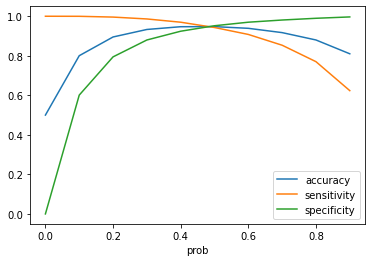

In [329]:
#Finding optimal cutoff probability
optimal_cutoff(y_train_df)

-The optimum cutoff point will be between 0.4 to 0.6, take 0.5 and proceed further

In [330]:
cutoff_prob=0.5
X = predictChurnWithProb(XGb_final, X_train_pca, y_train_re, cutoff_prob)

Roc_auc_score : 0.95
Sensitivity/Recall : 0.94
Specificity : 0.95
False Positive Rate : 0.048
Positive Predictive value : 0.95
Negative Predictive value : 0.94
sklearn precision score value : 0.95


In [331]:
#Lets predict on the test data
y_test_df = predictChurnWithProb(XGb_final, X_test_pca, y_test, cutoff_prob)

Roc_auc_score : 0.79
Sensitivity/Recall : 0.67
Specificity : 0.92
False Positive Rate : 0.084
Positive Predictive value : 0.42
Negative Predictive value : 0.97
sklearn precision score value : 0.42


### Conclusion on XGBoosting
#### Train Set
- Roc_auc_score : 0.95
- Sensitivity/Recall : 0.94
- Specificity : 0.95
    
#### Test Set
- Roc_auc_score : 0.79
- Sensitivity/Recall : 0.67
- Specificity : 0.92

### SVM

In [332]:
#lets try performing the model test in SVC
sv = SVC(C=1)

#fit
sv.fit(X_train_pca, y_train_re)

#predict on train
s_predict = sv.predict(X_train_pca)

In [333]:
#Check the model metrics
model_metrics(y_train_re, s_predict)

Roc_auc_score : 0.83
Sensitivity/Recall : 0.76
Specificity : 0.9
False Positive Rate : 0.1
Positive Predictive value : 0.88
Negative Predictive value : 0.79
sklearn precision score value : 0.88


In [334]:
#predict on test data
s_predict = sv.predict(X_test_pca)
model_metrics(y_test, s_predict)

Roc_auc_score : 0.81
Sensitivity/Recall : 0.71
Specificity : 0.9
False Positive Rate : 0.1
Positive Predictive value : 0.39
Negative Predictive value : 0.97
sklearn precision score value : 0.39


In [335]:
#Lets do the hyper tuning
params = {"C": [0.1, 1, 10, 100, 1000]}
svm = SVC()

#Setup the grid search and fit on the train set
model_cv = GridSearchCV(estimator = svm, param_grid= params, scoring="accuracy", cv=5, verbose=1, n_jobs=4, return_train_score=True)
model_cv.fit(X_train_pca, y_train_re)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=SVC(), n_jobs=4,
             param_grid={'C': [0.1, 1, 10, 100, 1000]}, return_train_score=True,
             scoring='accuracy', verbose=1)

In [336]:
# Check the score
print("The best params: {}".format(model_cv.best_params_))
print("The best score: {}".format(model_cv.best_score_))

The best params: {'C': 1000}
The best score: 0.8569321710363221


In [337]:
#Use C as 1000 and run again
sv_final = SVC(C=1000)

#fit
sv_final.fit(X_train_pca, y_train_re)

#predict on train
s_predict = sv_final.predict(X_train_pca)

In [338]:
#check the model metrics
model_metrics(y_train_re, s_predict)

Roc_auc_score : 0.87
Sensitivity/Recall : 0.83
Specificity : 0.9
False Positive Rate : 0.096
Positive Predictive value : 0.9
Negative Predictive value : 0.84
sklearn precision score value : 0.9


In [339]:
#Check the test dataset
s_predict = sv_final.predict(X_test_pca)
model_metrics(y_test, s_predict)

Roc_auc_score : 0.79
Sensitivity/Recall : 0.68
Specificity : 0.9
False Positive Rate : 0.1
Positive Predictive value : 0.38
Negative Predictive value : 0.97
sklearn precision score value : 0.38


### Conclusion on SVM
#### Train Set
- Roc_auc_score : 0.87
- Sensitivity/Recall : 0.83
- Specificity : 0.90
    
#### Test Set
- Roc_auc_score : 0.79
- Sensitivity/Recall : 0.68
- Specificity : 0.90

### Conclusions
We have used the dataset in all the models. The best choice will be selected based on the test data recall.

Especially for this churn case, sensitivity/recall is most important and telecom industry must work on these customers to retain rather than acquiring new customers

#### Summary of the Models -
##### -------------------------------------------------------
#### Logistic Regression and PCA
##### Train Set:
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.80
- Specificity : 0.80
    
##### Test Set:
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.79
- Specificity : 0.81
##### ------------------------------------------------------
####  Decision Tree 
##### Train Set
- Roc_auc_score : 0.84
- Sensitivity/Recall : 0.84
- Specificity : 0.84

##### Test Set
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.77
- Specificity : 0.83
##### ----------------------------------------------------
#### Random Forest
##### Train Set
- Roc_auc_score : 0.85
- Sensitivity/Recall : 0.84
- Specificity : 0.85

##### Test Set
- Roc_auc_score : 0.80
- Sensitivity/Recall : 0.76
- Specificity : 0.85
##### ----------------------------------------------------
#### Gradient Boosting 
##### Train Set
- Roc_auc_score : 0.95
- Sensitivity/Recall : 0.95
- Specificity : 0.94
    
##### Test Set
- Roc_auc_score : 0.78
- Sensitivity/Recall : 0.66
- Specificity : 0.91
##### ----------------------------------------------------
#### XGBoosting
##### Train Set
- Roc_auc_score : 0.95
- Sensitivity/Recall : 0.94
- Specificity : 0.95
    
##### Test Set
- Roc_auc_score : 0.79
- Sensitivity/Recall : 0.67
- Specificity : 0.92
##### ----------------------------------------------------
#### SVM
##### Train Set
- Roc_auc_score : 0.87
- Sensitivity/Recall : 0.83
- Specificity : 0.90
    
##### Test Set
- Roc_auc_score : 0.79
- Sensitivity/Recall : 0.68
- Specificity : 0.90
##### ----------------------------------------------------
- We suggest to see that the Sensitivity/Recall for the Logistic Regression with PCA is good for the prediction as is 0.79 compared to other models. We can see that Decision Tree and Random Forest are ok as we got 0.77 and 0.76 respectively. Boosting models are over fitting the data.

##### We notice that the following 5 factors affect the churn rate considerably -
- Total Incoming Minutes of usage in the August
- Total Incoming Minutes of usage in the July
- 2G data pack
- Roaming
- Sachet 2g

Also these metrics are inversely proportion to churn which means that we need to come up with campaigns that would keep people engaged either via calls (incoming) or on internet. One interesting thing to note here is that we see that a lot of people are hooked on 2G and hence are not churning. It presents us with a great opportunity that if shift these people from 2g to 3g then we have a greater chance of these people not churning. Hence discounts on 3G pack can be one of the popular marketing campaigns
